In [2]:
##############
### Import ###
##############

import matplotlib
import matplotlib.pyplot as plt
%matplotlib inline
matplotlib.rcParams.update({'font.size': 25})

from scipy.optimize import curve_fit

import numpy as np
import astropy
import warnings
warnings.filterwarnings('ignore')
from tqdm import tqdm_notebook

In [3]:
#Astropy
import astropy
from astropy.io import fits
from astropy.table import Table

# Matplotlib
import matplotlib
import matplotlib.pyplot as plt
# %matplotlib inline
matplotlib.rcParams.update({'font.size': 25})

#Numpy/Scipy
import numpy as np
from scipy.interpolate import InterpolatedUnivariateSpline as IUS
from scipy.optimize import curve_fit

class AetasStellae():
    '''
    A class to calculate a star's age and extinction using PARSEC isochrones and extinction law
    from Cardelli et al. 1989 by fitting Gaia (BP, RP) and 2MASS (J,H,K) photometry
    '''
    def __init__(self,teff,feh,cnalpha,obsphot,obsphot_err,distance,isochrones,rv=3.1):
        
        '''
        teff: [float] Teff of star
        feh: [float] metallicity [Fe/H] of star
        cnalpha: [array] [C/Fe],[N/Fe],[O/Fe],[Mg/Fe],[Si/Fe],[S/Fe],[Ca/Fe],[Ti/Fe]
        phot: [array] observed [BP,RP,J,H,K] photometry
        phot_err: [array] observed [BP,RP,J,H,K] photometry error
        distance: [float] distance to star in pc
        isochrones: [astropy Table] PARSEC isochrone table
        rv: [float] Rv value (=Av/E(B_V)) 
        '''
        
        # Observed Quantities
        self.teff = teff # temperature
        self.salfeh = self.salariscorrectedfeh(feh,cnalpha) # Metallicity
        self.phot = obsphot # photometry
        self.phot_err = obsphot_err # photometry errors
        
        # Distance modulus
        self.distance = distance
        self.distmod = 5.0*np.log10(distance)-5.0
        
        # PARSEC isochrones
        self.rv = rv
        self.labels = ['G_BPmag','G_RPmag','Jmag','Hmag','Ksmag']
        
        self.uniq_ages = np.unique(isochrones['logAge'])
        self.iso = isochrones[np.where(isochrones['MH']==self.closest(isochrones['MH'],self.salfeh))]
        
        age_idx = []
        for i in range(len(self.uniq_ages)):
            ages, = np.where(self.iso['logAge']==self.uniq_ages[i])
            age_idx.append(np.array([min(ages),max(ages)]))
        
        self.age_idx = np.asarray(age_idx)
                
        # Effective Wavelengths of different passbands in units of microns
        self.leff = {'G_BPmag':0.5387,'Gmag':0.6419,'G_RPmag':0.7667,'Jmag':1.2345,'Hmag':1.6393,'Ksmag':2.1757}
        
    def salariscorrectedfeh(self,feh,cnalpha):
        '''
        Calculate the Salaris corrected [Fe/H] according to Salaris et al. 1993 with Piersanti et al. 2007 and 
        Asplund et al. 2009. Also C and N have been added to the alpha elements and Ne has been excluded.
        
        Inputs:
        ------
            feh: metallcity of a star
            cnalpa: array of abundances np.array([C/Fe],[N/Fe],[O/Fe],[Mg/Fe],[Si/Fe],[S/Fe],[Ca/Fe],[Ti/Fe])
        
        Output:
        ------
            salfeh: Salaris corrected metallicity
        '''
        # hydrogen_wgt = 1.008 #IUPAC
        # atomic_wgts = np.array([12.011,14.007,15.999,24.305,28.085,32.06,40.078,47.867]) #IUPAC
        # asplund = np.array([8.43,7.83,8.69,7.60,7.51,7.12,6.34,4.95]) #Asplund et al. 2009
        # ZX_sol = 0.0181 # (Z/X) Asplund et al. 2009
        # a = sum(10**(asplund-12.00)*(atomic_wgts/hydrowh_wgt)*(1/0.0181)) # a = 0.78963627131196057
        # b = 1-a # b = 0.21036372868803943
        
        asplund = np.array([8.43,7.83,8.69,7.60,7.51,7.12,6.34,4.95])
        
        # assign solar value to stars if abundance is bad
        for j in range(len(cnalpha)):
            if cnalpha[j] < -100. or cnalpha[j] > 10. or np.isfinite(cnalpha[j])==False:
                cnalpha[j] = 0.0
                
        if np.isfinite(feh)==False:
            feh = 0.0
        
        # Calculate enhancement factor and corrected metallicity
        fac_acn = sum(10**(asplund+cnalpha))/sum(10**asplund)
        salfeh = feh+np.log10(0.78963627131196057*fac_acn+0.21036372868803943)
        
        return salfeh 
    
        
    def closest(self,data,value):
        '''
        Find nearest value in array to given value
        
        Inputs:
        ------
            data: data to search through 
            value: value of interest
        '''
        
        data = np.asarray(data)
    
        return data[(np.abs(np.subtract(data,value))).argmin()]
    
    def neighbors(self,data,value):
        '''
        Find values of two elements closest to the given value
    
        Inputs:
        ------
            data: data to search through 
            value: value of interest
        
        Output:
        ------
            close1: closest value under the given value
            close2: closest value over the given value
        '''
    
        data = np.asarray(data)
        close1 = data[(np.abs(np.subtract(data,value))).argmin()]
        data = data[np.where(data!=close1)]
        close2 = data[(np.abs(np.subtract(data,value))).argmin()]
    
        return close1,close2
    
    def ccm_a(self,x):
        '''
        a(x) function from ccm et al. 1989
    
        Input:
        -----
            x: effective wavelength in units of 1/micron
        
        Output:
        ------
            a: a function value  
        '''
        if 0.3 <= x < 1.1:
            a = 0.574*(x**1.61)
            return a
    
        elif 1.1 <= x < 3.3:
            y = x - 1.82
            a = (1.+0.17699*y-0.50477*(y**2)-0.02427*(y**3)+0.72085*(y**4)+
                 0.01979*(y**5)-0.77530*(y**6)+0.32999*(y**7))
            return a
    
        elif 3.3 <= x < 8.0:
            if x < 5.9:
                a = 1.752-0.136*x-0.104/((x-4.67)**2+0.341)
                return a
        
            else:
                fa = -0.04473*((x-5.9)**2)+0.1207*((x-5.9)**3)
                a = 1.752-0.136*x-0.104/((x-4.67)**2+0.341)+fa
                return a       
    
    def ccm_b(self,x):
        '''
        b(x) function from ccm et al. 1989
    
        Input:
        -----
            x: effective wavelength in units of 1/micron
        
        Output:
        ------
            b: b function value 
        '''
        if 0.3 <= x < 1.1:
            b = -0.527*(x**1.61)
            return b
    
        elif 1.1 <= x <= 3.3:
            y = x - 1.82
            b = (1.41338*y+2.28305*(y**2)+1.07233*(y**3)-5.38434*(y**4)-
                 0.62251*(y**5)+5.30260*(y**6)-2.09002*(y**7))
            return b
    
        elif 3.3 <= x < 8.0:
            if x < 5.9:
                b = -3.090+1.825*x+1.206/((x-4.62)**2+0.263)
                return b
        
            else:
                fb = 0.2130*((x-5.9)**2)+0.1207*((x-5.9)**3)
                b = -3.090+1.825*x+1.206/((x-4.62)**2+0.263)+fb
                return b
    
    def ccm_alav(self,wave):
        '''
        Calculate A\lambda/Av
    
        Inputs:
        ------
            wave: effective wavelength in units of micron
        
        Output:
        ------
            alav: A\lambda/Av
        '''
        x=1/wave
        alav = self.ccm_a(x)+self.ccm_b(x)/self.rv
        return alav    
        
    def teff2appmags(self,teff,age,ak,verbose=False):
        '''
        Calculate the expected apparent magnitude of a star
        
        Inputs:
        ------
            teff: Teff of star 
            age: age of star
            ak: extinction in the 2MASS K band
        
        Output:
        ------
            calc_mag: expected intrinsic magnitude for the given temperature
        '''
        
        #Some calcualtions to set things up
        lgteff = np.log10(teff)
        
        abpak = self.ccm_alav(self.leff['G_BPmag'])/self.ccm_alav(self.leff['Ksmag'])
        arpak = self.ccm_alav(self.leff['G_RPmag'])/self.ccm_alav(self.leff['Ksmag'])
        ajak = self.ccm_alav(self.leff['Jmag'])/self.ccm_alav(self.leff['Ksmag'])
        ahak = self.ccm_alav(self.leff['Hmag'])/self.ccm_alav(self.leff['Ksmag'])
        
        extincts = np.array([abpak,arpak,ajak,ahak,1.0])*ak
        
        lgage = np.log10(age*10**9)
        
        if verbose:
            print('Input [Age, Ak]: ',[age,ak])
        
        # Figure out if age is actually in the ages given in the isochrone table
        if lgage in self.uniq_ages:
            
            ### pick out a single isochrone 
            aidx, = np.where(self.uniq_ages==lgage)
            iso_ = self.iso[self.age_idx[int(aidx)][0]:self.age_idx[int(aidx)][1]]
            
            if verbose:
                print('lgteff, min, max: ',[lgteff,min(iso_['logTe']),max(iso_['logTe'])])
            
            if lgteff < min(iso_['logTe']) or lgteff > max(iso_['logTe']):
                if verbose:
                    print('[BP,RP,J,H,K]: ',np.array([999999.0, 999999.0, 999999.0, 999999.0, 999999.0]))
                return np.array([999999.0, 999999.0, 999999.0, 999999.0, 999999.0])
            
            ### sort so temp is always increasing
            sidx = np.argsort(iso_['logTe'])
            slogTe = iso_['logTe'][sidx]
            _, uidx = np.unique(slogTe,return_index=True)
            slogTe = slogTe[uidx]
            
            ### use a spline to get the apparent mags
            calc_mags = 999999.0*np.ones(5)
            calc_mags0 = 99999.0*np.ones(5)
            for i in range(5):
                mag_spl = IUS(slogTe,iso_[self.labels[i]][sidx][uidx])
                calc_mags[i] = mag_spl(lgteff)+self.distmod+extincts[i]
                calc_mags0[i] = mag_spl(lgteff)+self.distmod
            
            if verbose:
                print('[BP,RP,J,H,K]: ',calc_mags)
                print('No Ext [BP,RP,J,H,K]: ',calc_mags0)
            return calc_mags
            
        else:
            lgage_lo,lgage_hi = self.neighbors(self.uniq_ages,lgage)
            if verbose:
                print('[age_lo,age_hi]: ',[10**lgage_lo/10**9,10**lgage_hi/10**9])
            
            ### Pick out single isochrones
        
            # younger
            aidx_lo, = np.where(self.uniq_ages==lgage_lo)
            iso_lo = self.iso[self.age_idx[int(aidx_lo)][0]:self.age_idx[int(aidx_lo)][1]]
            
            # older
            aidx_hi, = np.where(self.uniq_ages==lgage_hi)
            iso_hi = self.iso[self.age_idx[int(aidx_hi)][0]:self.age_idx[int(aidx_hi)][1]]
            
            if verbose:
                print('lgteff, min, max: ',[lgteff,min(iso_lo['logTe']),max(iso_lo['logTe'])])
            
            ### Temperature Check
            if lgteff < min(iso_lo['logTe']) or lgteff > max(iso_lo['logTe']):
                if verbose:
                    print('[BP,RP,J,H,K]: ',np.array([999999.0, 999999.0, 999999.0, 999999.0, 999999.0]))
                return np.array([999999.0, 999999.0, 999999.0, 999999.0, 999999.0])
            if lgteff < min(iso_hi['logTe']) or lgteff > max(iso_hi['logTe']):
                if verbose:
                    print('[BP,RP,J,H,K]: ',np.array([999999.0, 999999.0, 999999.0, 999999.0, 999999.0]))
                return np.array([999999.0, 999999.0, 999999.0, 999999.0, 999999.0])
            
            ### sort so temp is always increasing
            
            # younger
            sidx_lo = np.argsort(iso_lo['logTe'])
            slogTe_lo = iso_lo['logTe'][sidx_lo]
            _, uidx_lo = np.unique(slogTe_lo,return_index=True)
            slogTe_lo = slogTe_lo[uidx_lo]
            
            # older
            sidx_hi = np.argsort(iso_hi['logTe'])
            slogTe_hi = iso_hi['logTe'][sidx_hi]
            _, uidx_hi = np.unique(slogTe_hi,return_index=True)
            slogTe_hi = slogTe_hi[uidx_hi]
            
            ### use a spline to get the apparent mags
            age_lo = 10**lgage_lo/10**9
            age_hi = 10**lgage_hi/10**9
            calc_mags = 999999.0*np.ones(5)
            calc_mags0 = 999999.0*np.ones(5)
            for i in range(5):
                mag_spl_lo = IUS(slogTe_lo,iso_lo[self.labels[i]][sidx_lo][uidx_lo])
                mag_spl_hi = IUS(slogTe_hi,iso_hi[self.labels[i]][sidx_hi][uidx_hi])
                age_spl_interp = np.poly1d(np.squeeze(np.polyfit([age_lo,age_hi],
                                                                 [mag_spl_lo(lgteff),mag_spl_hi(lgteff)],1)))
                calc_mags[i] = age_spl_interp(age)+self.distmod+extincts[i]
                calc_mags0[i] = age_spl_interp(age)+self.distmod
            
            if verbose:
                print('[BP,RP,J,H,K]: ',calc_mags)
                print('No Ext [BP,RP,J,H,K]: ',calc_mags0)
            return calc_mags
    
    def fit(self,guess_ages=np.arange(0,14),guess_aks=np.array([0,0.5,1.0]),verbose=False):
        '''
        Find best fitting age and Ak values for a star by searching chisq space given initial guesses for
        age and extinction.
        
        Inputs:
        ------
            guess_ages: [array] initial guesses for ages in Gyr
            guess_aks: [array] initial guesses for Ak 
            
        Output:
        ------
            best_params: [array] best fitting age and Ak 
            best_params_err:
        '''
            
        # initialize lists
        curve_ages = []
        curve_aks = []
        curve_ages_err = []
        curve_aks_err = []
        curve_chi = []

        # loop over age and ak space 
        for j in range(len(guess_ages)):
            for k in range(len(guess_aks)):  
                try:
                    # calculate best fit parameters and covariance matrix
                    popt,pcov = curve_fit(self.teff2appmags,self.teff,self.phot,p0=[guess_ages[j],guess_aks[k]],
                                          bounds=((0.,0.),(14.,2.)),method='trf',sigma=self.phot_err,
                                          absolute_sigma=True,maxfev=5000)

                    # populate lists
                    curve_ages.append(popt[0])
                    curve_aks.append(popt[1])
                    curve_ages_err.append(np.sqrt(pcov[0][0]))
                    curve_aks_err.append(np.sqrt(pcov[1][1]))
                    curve_mags = np.asarray(self.teff2appmags(self.teff,popt[0],popt[1]))
                    curve_chi.append(sum((curve_mags-self.phot)**2/self.phot_err**2))

                except:
                    #populate lists
                    curve_mags = 999999.0*np.ones(5)
                    curve_ages.append(999999.0)
                    curve_aks.append(999999.0)
                    curve_ages_err.append(999999.0)
                    curve_aks_err.append(999999.0)
                    curve_chi.append(999999.0)
        
        # find smallest chisq value and corresponding age and Ak
        idx = np.asarray(curve_chi).argmin()
        chi = np.min(curve_chi)
        age = np.asarray(curve_ages)[idx]
        ak = np.asarray(curve_aks)[idx]
        age_err = np.asarray(curve_ages_err)[idx]
        ak_err = np.asarray(curve_aks_err)[idx]

        best_params = np.array([age,ak])
        best_params_err = np.array([age_err,ak_err])
        best_mags = self.teff2appmags(self.teff,age,ak)

        if verbose:
            print('Best Fit Params [Age, Ak]:',np.round(best_params,3))
            print('Best Fit Params Err [Age, Ak]:',np.round(best_params_err,3))
            print('Best Fit [BP,RP,J,H,K]: ',np.round(best_mags,3))
            print('Obs Phot [BP,RP,J,H,K]: ',np.round(self.phot,3))
            print('Obs Phot Err [BP,RP,J,H,K]: ',np.round(self.phot_err,3))

        return best_params, best_params_err
        
    def diagnostic(self,best_fit_params,star_name=None,lit_age=None,filename=None,verbose=False):
        '''
        Create a diagnostic plot for the best fit age and Ak values that is optionally saved
        
        Inputs:
        ------
            best_fit_params: [array]
            lit_age: [float] optional known literature age in Gyr
            filename: [str] optional filename of plot if saving
        '''
        
        # initialize arrays
        ages = np.arange(0,15,0.25)
        theos = 999999.0*np.ones((len(ages),5))
        theos_noext = 999999.0*np.ones((len(ages),5))
    
        # calculate theoretical age for given ages
        for j in range(len(ages)):
            theos[j,:] = self.teff2appmags(self.teff,ages[j],best_fit_params[1]) # use best Ak 
            theos_noext[j,:] = self.teff2appmags(self.teff,ages[j],0) # no extinction
        
        # plot results
        fig, ax = plt.subplots(1,5,figsize=[67,15])
        for i in range(5):
            ax[i].scatter(theos[:,i],ages,s=100,label='Best Fit Ak')
            ax[i].plot(theos[:,i],ages)
            
            ax[i].scatter(theos_noext[:,i],ages,s=100,label='No Ak')
            ax[i].plot(theos_noext[:,i],ages)
            
            ax[i].axhline(best_fit_params[0],c='r',ls='--',label='Best Fit Age',lw=3.0)
            
            if lit_age!=None:
                ax[i].axhline(lit_age,c='k',ls='--',label='Lit Age',lw=3.0)
            
            ax[i].axvline(self.phot[i],ls='--',c='magenta',lw=3.0)
            
            ax[i].set_xlim(self.phot[i]-3.0,self.phot[i]+3.0)
            ax[i].set_ylim(bottom=0.01)
            
            ax[i].set_title(r'{}: {:.3f}'.format(self.labels[i],self.phot[i]))
            ax[i].set_xlabel(r'Magnitude')
            
        ax[0].legend()

        ax[0].set_ylabel('Age')
        
        if star_name!=None:
            plt.suptitle(r'{}; {:.3f} Gyr; {:.3f} dex; {:.3f} kpc'.format(star_name,best_fit_params[0],
                                                                          best_fit_params[1],self.distance))
        
        else:
            plt.suptitle(r'{:.3f} Gyr; {:.3f} dex; {:.3f} kpc'.format(best_fit_params[0],best_fit_params[1],
                                                                      self.distance))
    
        if filename!=None:
            plt.savefig(filename,bbox_inches='tight')
        plt.show()
        
    def extinct(self,age,verbose=False):
        '''
        Calculate the K band (fiducial band here) extintion by interpolating color index as a function
        of temperature for a given age.

        Inputs:
        ------
        age: [float] age in Gyr

        Output:
        ------
        ak: extinction in the K band
        '''

        #Some calcualtions to set things up
        lgteff = np.log10(self.teff)

        ebpk_k = ((self.ccm_alav(self.leff['G_BPmag'])-self.ccm_alav(self.leff['Ksmag']))/
              self.ccm_alav(self.leff['Ksmag']))
        erpk_k = ((self.ccm_alav(self.leff['G_RPmag'])-self.ccm_alav(self.leff['Ksmag']))/
              self.ccm_alav(self.leff['Ksmag']))
        ejk_k = ((self.ccm_alav(self.leff['Jmag'])-self.ccm_alav(self.leff['Ksmag']))/
             self.ccm_alav(self.leff['Ksmag']))
        ehk_k = ((self.ccm_alav(self.leff['Hmag'])-self.ccm_alav(self.leff['Ksmag']))/
             self.ccm_alav(self.leff['Ksmag']))

        ccm = np.array([ebpk_k,erpk_k,ejk_k,ehk_k])

        lgage = np.log10(age*10**9)

        if verbose:
            print('Input [Age, teff, Salaris [Fe/H]]: ',[age,self.teff,self.salfeh])

        # Figure out if age is actually in the ages given in the isochrone table
        if lgage in self.uniq_ages:

            ### pick out a single isochrone 
            aidx, = np.where(self.uniq_ages==lgage)
            iso_ = self.iso[self.age_idx[int(aidx)][0]:self.age_idx[int(aidx)][1]]

            if verbose:
                print('lgteff, min, max: ',[lgteff,min(iso_['logTe']),max(iso_['logTe'])])

            if lgteff < min(iso_['logTe']) or lgteff > max(iso_['logTe']):
                if verbose:
                    print('Ak: ',999999.0)
                self.ak = 999999.0
#                 return 999999.0

            ### sort so temp is always increasing
            sidx = np.argsort(iso_['logTe'])
            slogTe = iso_['logTe'][sidx]
            _, uidx = np.unique(slogTe,return_index=True)
            slogTe = slogTe[uidx]

            ### use a spline to get the intrinsic color and calculate the reddening
            calc_reds = 999999.*np.ones(4)
            for i in range(4):
                color_spl = IUS(slogTe,(iso_[self.labels[i]]-iso_['Ksmag'])[sidx][uidx])
                calc_reds[i] = (self.phot[i]-self.phot[4])-color_spl(lgteff)

            ### calculate the Ak value
            calc_ak = np.median(np.divide(calc_reds,ccm))

            if verbose:
                print('[ebpk,erpk,ejk,ehk]: ',calc_reds)
                print(ccm)
                print(np.divide(calc_reds,ccm))
                print('Calc Ak: ',calc_ak)
            self.ak = calc_ak
#             return calc_ak

        else:
            lgage_lo,lgage_hi = self.neighbors(self.uniq_ages,lgage)
            if verbose:
                print('[age_lo,age_hi]: ',[10**lgage_lo/10**9,10**lgage_hi/10**9])

            ### Pick out single isochrones

            # younger
            aidx_lo, = np.where(self.uniq_ages==lgage_lo)
            iso_lo = self.iso[self.age_idx[int(aidx_lo)][0]:self.age_idx[int(aidx_lo)][1]]

            # older
            aidx_hi, = np.where(self.uniq_ages==lgage_hi)
            iso_hi = self.iso[self.age_idx[int(aidx_hi)][0]:self.age_idx[int(aidx_hi)][1]]

            if verbose:
                print('lgteff, min, max: ',[lgteff,min(iso_lo['logTe']),max(iso_lo['logTe'])])

            ### Temperature Check
            if lgteff < min(iso_lo['logTe']) or lgteff > max(iso_lo['logTe']):
                if verbose:
                    print('Ak: ',999999.0)
                self.ak = 999999.0   
#                 return 999999.0
            if lgteff < min(iso_hi['logTe']) or lgteff > max(iso_hi['logTe']):
                if verbose:
                    print('Ak: ',999999.0)
                self.ak = 999999.0
#                 return 999999.0

            ### sort so temp is always increasing

            # younger
            sidx_lo = np.argsort(iso_lo['logTe'])
            slogTe_lo = iso_lo['logTe'][sidx_lo]
            _, uidx_lo = np.unique(slogTe_lo,return_index=True)
            slogTe_lo = slogTe_lo[uidx_lo]

            # older
            sidx_hi = np.argsort(iso_hi['logTe'])
            slogTe_hi = iso_hi['logTe'][sidx_hi]
            _, uidx_hi = np.unique(slogTe_hi,return_index=True)
            slogTe_hi = slogTe_hi[uidx_hi]

            ### use a spline to get the apparent mags
            age_lo = 10**lgage_lo/10**9
            age_hi = 10**lgage_hi/10**9
            calc_reds = 999999.*np.ones(4)
            for i in range(4):
                color_spl_lo = IUS(slogTe_lo,(iso_lo[self.labels[i]]-iso_lo['Ksmag'])[sidx_lo][uidx_lo])
                color_spl_hi = IUS(slogTe_hi,(iso_hi[self.labels[i]]-iso_hi['Ksmag'])[sidx_hi][uidx_hi])
                age_spl_interp = np.poly1d(np.squeeze(
                    np.polyfit([age_lo,age_hi],[color_spl_lo(lgteff),color_spl_hi(lgteff)],1)))
                if verbose:
                    print(age_spl_interp)
                    print(lgteff)
                    print(age_spl_interp(lgteff))
                    print(self.phot[i]-self.phot[4])
                calc_reds[i] = (self.phot[i]-self.phot[4])-age_spl_interp(age)

            ### calculate the Ak value
            calc_ak = np.median(np.divide(calc_reds,ccm))

            if verbose:
                print('[ebpk,erpk,ejk,ehk]: ',calc_reds)
                print('CCM: ',ccm)
                print('Ak each band',np.divide(calc_reds,ccm))
                print('Calc Ak: ',calc_ak)
                
            self.ak = calc_ak
#             return calc_ak

    def teff2appmags2(self,teff,age,verbose=False):
        '''
        Calculate the expected apparent magnitude of a star
        
        Inputs:
        ------
            teff: Teff of star 
            age: age of star
            ak: extinction in the 2MASS K band
        
        Output:
        ------
            calc_mag: expected intrinsic magnitude for the given temperature
        '''
        
        #Some calcualtions to set things up
        lgteff = np.log10(teff)
        
        abpak = self.ccm_alav(self.leff['G_BPmag'])/self.ccm_alav(self.leff['Ksmag'])
        arpak = self.ccm_alav(self.leff['G_RPmag'])/self.ccm_alav(self.leff['Ksmag'])
        ajak = self.ccm_alav(self.leff['Jmag'])/self.ccm_alav(self.leff['Ksmag'])
        ahak = self.ccm_alav(self.leff['Hmag'])/self.ccm_alav(self.leff['Ksmag'])
        
        extincts = np.array([abpak,arpak,ajak,ahak,1.0])*self.ak
        
        lgage = np.log10(age*10**9)
        
        if verbose:
            print('Input [Age, Ak]: ',[age,self.ak])
        
        # Figure out if age is actually in the ages given in the isochrone table
        if lgage in self.uniq_ages:
            
            ### pick out a single isochrone 
            aidx, = np.where(self.uniq_ages==lgage)
            iso_ = self.iso[self.age_idx[int(aidx)][0]:self.age_idx[int(aidx)][1]]
            
            if verbose:
                print('lgteff, min, max: ',[lgteff,min(iso_['logTe']),max(iso_['logTe'])])
            
            if lgteff < min(iso_['logTe']) or lgteff > max(iso_['logTe']):
                if verbose:
                    print('[BP,RP,J,H,K]: ',np.array([999999.0, 999999.0, 999999.0, 999999.0, 999999.0]))
                return np.array([999999.0, 999999.0, 999999.0, 999999.0, 999999.0])
            
            ### sort so temp is always increasing
            sidx = np.argsort(iso_['logTe'])
            slogTe = iso_['logTe'][sidx]
            _, uidx = np.unique(slogTe,return_index=True)
            slogTe = slogTe[uidx]
            
            ### use a spline to get the apparent mags
            calc_mags = 999999.0*np.ones(5)
            calc_mags0 = 99999.0*np.ones(5)
            for i in range(5):
                mag_spl = IUS(slogTe,iso_[self.labels[i]][sidx][uidx])
                calc_mags[i] = mag_spl(lgteff)+self.distmod+extincts[i]
                calc_mags0[i] = mag_spl(lgteff)+self.distmod
            
            if verbose:
                print('[BP,RP,J,H,K]: ',calc_mags)
                print('No Ext [BP,RP,J,H,K]: ',calc_mags0)
            return calc_mags
            
        else:
            lgage_lo,lgage_hi = self.neighbors(self.uniq_ages,lgage)
            if verbose:
                print('[age_lo,age_hi]: ',[10**lgage_lo/10**9,10**lgage_hi/10**9])
            
            ### Pick out single isochrones
        
            # younger
            aidx_lo, = np.where(self.uniq_ages==lgage_lo)
            iso_lo = self.iso[self.age_idx[int(aidx_lo)][0]:self.age_idx[int(aidx_lo)][1]]
            
            # older
            aidx_hi, = np.where(self.uniq_ages==lgage_hi)
            iso_hi = self.iso[self.age_idx[int(aidx_hi)][0]:self.age_idx[int(aidx_hi)][1]]
            
            if verbose:
                print('lgteff, min, max: ',[lgteff,min(iso_lo['logTe']),max(iso_lo['logTe'])])
            
            ### Temperature Check
            if lgteff < min(iso_lo['logTe']) or lgteff > max(iso_lo['logTe']):
                if verbose:
                    print('[BP,RP,J,H,K]: ',np.array([999999.0, 999999.0, 999999.0, 999999.0, 999999.0]))
                return np.array([999999.0, 999999.0, 999999.0, 999999.0, 999999.0])
            if lgteff < min(iso_hi['logTe']) or lgteff > max(iso_hi['logTe']):
                if verbose:
                    print('[BP,RP,J,H,K]: ',np.array([999999.0, 999999.0, 999999.0, 999999.0, 999999.0]))
                return np.array([999999.0, 999999.0, 999999.0, 999999.0, 999999.0])
            
            ### sort so temp is always increasing
            
            # younger
            sidx_lo = np.argsort(iso_lo['logTe'])
            slogTe_lo = iso_lo['logTe'][sidx_lo]
            _, uidx_lo = np.unique(slogTe_lo,return_index=True)
            slogTe_lo = slogTe_lo[uidx_lo]
            
            # older
            sidx_hi = np.argsort(iso_hi['logTe'])
            slogTe_hi = iso_hi['logTe'][sidx_hi]
            _, uidx_hi = np.unique(slogTe_hi,return_index=True)
            slogTe_hi = slogTe_hi[uidx_hi]
            
            ### use a spline to get the apparent mags
            age_lo = 10**lgage_lo/10**9
            age_hi = 10**lgage_hi/10**9
            calc_mags = 999999.0*np.ones(5)
            calc_mags0 = 999999.0*np.ones(5)
            for i in range(5):
                mag_spl_lo = IUS(slogTe_lo,iso_lo[self.labels[i]][sidx_lo][uidx_lo])
                mag_spl_hi = IUS(slogTe_hi,iso_hi[self.labels[i]][sidx_hi][uidx_hi])
                age_spl_interp = np.poly1d(np.squeeze(np.polyfit([age_lo,age_hi],
                                                                 [mag_spl_lo(lgteff),mag_spl_hi(lgteff)],1)))
                calc_mags[i] = age_spl_interp(age)+self.distmod+extincts[i]
                calc_mags0[i] = age_spl_interp(age)+self.distmod
            
            if verbose:
                print('[BP,RP,J,H,K]: ',calc_mags)
                print('No Ext [BP,RP,J,H,K]: ',calc_mags0)
            return calc_mags

# Cardelli Extinction

In [4]:
leff = {'BP':0.5387,'G':0.6419,'RP':0.7667,'J':1.2345,'H':1.6393,'K':2.1757}
def ccm_a(x):
    '''
    a(x) function from Cardelli et al. 1989
    
    Input:
    -----
        x: effective wavelength in units of 1/micron
        
    Output:
    ------
        a: a function value  
    '''
    if 0.3 <= x < 1.1:
        a = 0.574*(x**1.61)
        return a
    
    elif 1.1 <= x < 3.3:
        y = x - 1.82
        a = (1.+0.17699*y-0.50477*(y**2)-0.02427*(y**3)+0.72085*(y**4)+
                0.01979*(y**5)-0.77530*(y**6)+0.32999*(y**7))
        return a
    
    elif 3.3 <= x < 8.0:
        if x < 5.9:
            a = 1.752-0.136*x-0.104/((x-4.67)**2+0.341)
            return a
        
        else:
            fa = -0.04473*((x-5.9)**2)+0.1207*((x-5.9)**3)
            a = 1.752-0.136*x-0.104/((x-4.67)**2+0.341)+fa
            return a       
    
def ccm_b(x):
    '''
    b(x) function from Cardelli et al. 1989
    
    Input:
    -----
        x: effective wavelength in units of 1/micron
        
    Output:
    ------
        b: b function value 
    '''
    if 0.3 <= x < 1.1:
        b = -0.527*(x**1.61)
        return b
    
    elif 1.1 <= x <= 3.3:
        y = x - 1.82
        b = (1.41338*y+2.28305*(y**2)+1.07233*(y**3)-5.38434*(y**4)-
                0.62251*(y**5)+5.30260*(y**6)-2.09002*(y**7))
        return b
    
    elif 3.3 <= x < 8.0:
        if x < 5.9:
            b = -3.090+1.825*x+1.206/((x-4.62)**2+0.263)
            return b
        
        else:
            fb = 0.2130*((x-5.9)**2)+0.1207*((x-5.9)**3)
            b = -3.090+1.825*x+1.206/((x-4.62)**2+0.263)+fb
            return b
    
def ccm_alav(wave,rv):
    '''
    Calculate A\lambda/Av
    
    Inputs:
    ------
        wave: effective wavelength in units of micron
        rv: Rv value (=Av/E(B_V))
        
    Output:
    ------
        alav: A\lambda/Av
    '''
    x=1/wave
    alav = ccm_a(x)+ccm_b(x)/rv
    return alav

ejk_ak = (ccm_alav(leff['J'],3.1)-ccm_alav(leff['K'],3.1))/ccm_alav(leff['K'],3.1)
ebv_ak = (ccm_alav(0.445,3.1)-ccm_alav(0.551,3.1))/ccm_alav(leff['K'],3.1)

def closest(data,value):
    '''
    Find nearest value in array to given value
        
    Inputs:
    ------
        data: data to search through 
        value: value of interest
    '''
        
    data = np.asarray(data)
    return data[(np.abs(np.subtract(data,value))).argmin()]

def mad(dat):
    return np.nanmedian(np.abs(dat-np.nanmedian(dat)))

In [5]:
abp_ebv = ccm_alav(leff['BP'],3.1)/(ccm_alav(0.445,3.1)-ccm_alav(0.551,3.1))
arp_ebv = ccm_alav(leff['RP'],3.1)/(ccm_alav(0.445,3.1)-ccm_alav(0.551,3.1))
aj_ebv = ccm_alav(leff['J'],3.1)/(ccm_alav(0.445,3.1)-ccm_alav(0.551,3.1))
ah_ebv = ccm_alav(leff['H'],3.1)/(ccm_alav(0.445,3.1)-ccm_alav(0.551,3.1))
ak_ebv = ccm_alav(leff['K'],3.1)/(ccm_alav(0.445,3.1)-ccm_alav(0.551,3.1))

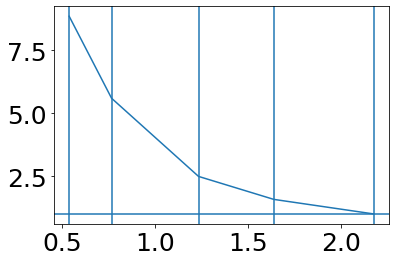

In [6]:
plt.plot([leff['BP'],leff['RP'],leff['J'],leff['H'],leff['K']],
         [ccm_alav(leff['BP'],3.1)/ccm_alav(leff['K'],3.1),ccm_alav(leff['RP'],3.1)/ccm_alav(leff['K'],3.1),
          ccm_alav(leff['J'],3.1)/ccm_alav(leff['K'],3.1),
          ccm_alav(leff['H'],3.1)/ccm_alav(leff['K'],3.1),ccm_alav(leff['K'],3.1)/ccm_alav(leff['K'],3.1)])
plt.axhline(1.0)

for i in [leff['BP'],leff['RP'],leff['J'],leff['H'],leff['K']]:
    plt.axvline(i)

# PARSEC

In [7]:
massive = fits.getdata('/Users/joshuapovick/Desktop/Research/parsec/parsec_massive.fits.gz',0)
massive = Table(massive[np.where(massive['label']==3.0)])
massive['index'] = np.arange(len(massive))
massive = massive[np.argsort(massive['logAge'])]
massive = massive['index','MH','logAge','logTe','logg','Gmag','G_BPmag','G_RPmag','Jmag','Hmag','Ksmag']

# Globular Clusters

In [8]:
### GCS Data
gcs = fits.getdata('/Users/joshuapovick/Desktop/Research/fits/allStar-r13-l33-58932beta_apa_dist_galvel_gc.fits.gz')
gcs = Table(gcs[np.where((gcs['LOGG']>0.0)&(gcs['FE_H']>-9999.0)&(np.isfinite(gcs['FE_H'])==True))])
gcs = gcs[np.where((gcs['CLUSTER']=='47Tuc')|(gcs['CLUSTER']=='M10')|(gcs['CLUSTER']=='M107')|
                   (gcs['CLUSTER']=='M12')|(gcs['CLUSTER']=='M13')|(gcs['CLUSTER']=='M15')|
                   (gcs['CLUSTER']=='M19')|(gcs['CLUSTER']=='M2')|(gcs['CLUSTER']=='M22')|
                   (gcs['CLUSTER']=='M3')|(gcs['CLUSTER']=='M4')|(gcs['CLUSTER']=='M5')|
                   (gcs['CLUSTER']=='M53')|(gcs['CLUSTER']=='M54')|(gcs['CLUSTER']=='M55')|
                   (gcs['CLUSTER']=='M68')|(gcs['CLUSTER']=='M71')|(gcs['CLUSTER']=='M79')|
                   (gcs['CLUSTER']=='M92')|(gcs['CLUSTER']=='NGC1851')|(gcs['CLUSTER']=='NGC2808')|
                   (gcs['CLUSTER']=='NGC288')|(gcs['CLUSTER']=='NGC3201')|(gcs['CLUSTER']=='NGC362')|
                   (gcs['CLUSTER']=='NGC5053')|(gcs['CLUSTER']=='NGC5466')|(gcs['CLUSTER']=='NGC6304')|
                   (gcs['CLUSTER']=='NGC6388')|(gcs['CLUSTER']=='NGC6752')|(gcs['CLUSTER']=='NGC6760'))]

### DR17
dr17 = fits.getdata('/Users/joshuapovick/Desktop/Research/fits/allStarLite-dr17-synspec.fits.gz')
_, gcs_ind, dr17_ind = np.intersect1d(gcs['APOGEE_ID'], dr17['APOGEE_ID'], return_indices=True)

gcsdr17 = dr17[dr17_ind]
gcs = gcs[gcs_ind]

gcs_clus = np.unique(gcs['CLUSTER'])

Harris-APOGEE: -0.07535000324249275
VandenBerg-APOGEE: -0.08275001049041741
Overall: -0.07905000686645508


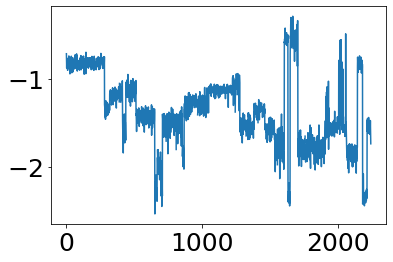

In [9]:
med_apo_feh = np.array([])
for i in range(len(gcs_clus)):
    clus = np.where((gcs['CLUSTER']==gcs_clus[i])&(gcsdr17['FE_H']>-100.))
    med_apo_feh = np.append(med_apo_feh,np.nanmedian(gcsdr17['FE_H'][clus]))
#     print('{}: {:.3f}'.format(gcs_clus[i],np.nanmedian(gcsdr17['FE_H'][clus])))
    
harris_dist = np.array([4.5,4.4,6.3,4.8,7.1,10.4,8.8,11.5,3.2,10.2,2.2,7.5,17.9,26.5,5.4,10.3,4.0,12.9,8.3,12.1,
                        9.6,8.9,4.9,8.6,17.4,16.0,5.9,9.9,4.0,7.4])*1000
harris_feh = np.array([-0.72,-1.56,-1.02,-1.37,-1.53,-2.37,-1.74,-1.65,-1.70,-1.50,-1.16,-1.29,-2.10,-1.49,-1.94,
                       -2.23,-0.78,-1.60,-2.31,-1.18,-1.14,-1.32,-1.59,-1.26,-2.27,-1.98,-0.45,-0.55,-1.54,-0.40])
harris_ext = np.array([0.04,0.28,0.33,0.19,0.02,0.10,0.38,0.06,0.34,0.01,0.35,0.03,0.02,0.15,0.08,0.05,0.25,0.01,
                       0.02,0.02,0.22,0.03,0.24,0.05,0.01,0.00,0.54,0.37,0.04,0.77])
vanden_feh = np.array([-0.76,-1.57,-1.03,-1.33,-1.58,-2.33,-1.53,-1.66,-1.70,-1.50,-1.18,-1.33,-2.06,-1.44,-1.93,
                       -2.27,-0.82,-1.60,-2.35,-1.18,-1.18,-1.32,-1.51,-1.30,-2.30,-2.31,-0.37,-0.77,-1.55,-0.60])
vanden_age = np.array([11.75,11.75,12.00,13.00,12.00,12.75,11.90,11.75,12.50,11.75,11.50,11.50,12.25,11.75,13.00,
                       12.00,11.00,11.0,12.75,11.00,11.00,11.50,11.50,11.75,12.25,12.50,11.25,12.03,12.50,11.26])

gcs_dist = 999999.0*np.ones(len(gcs))
for i in range(len(np.unique(gcs['CLUSTER']))):
    clus = np.where(gcs['CLUSTER']==np.unique(gcs['CLUSTER'])[i])
    gcs_dist[clus] = harris_dist[i]
#     print(clus)

print('Harris-APOGEE:',np.median(harris_feh-med_apo_feh))
print('VandenBerg-APOGEE:',np.median(vanden_feh-med_apo_feh))
print('Overall:',np.median([np.median(harris_feh-med_apo_feh),np.median(vanden_feh-med_apo_feh)]))

shiftfeh = 999999*np.ones(len(gcsdr17))
for i in range(len(gcsdr17)):
    clus = np.where(gcs['CLUSTER']==gcs['CLUSTER'][i])
    if np.isfinite(gcsdr17['FE_H'][i])==False:
        shiftfeh[i] = (np.median(gcsdr17['FE_H'][clus])+
                       np.median([np.median(harris_feh-med_apo_feh),np.median(vanden_feh-med_apo_feh)]))
    else:
        shiftfeh[i] = (gcsdr17['FE_H'][i]+
                       np.median([np.median(harris_feh-med_apo_feh),np.median(vanden_feh-med_apo_feh)]))
        
plt.plot(shiftfeh)

In [10]:
def salaris(feh,cnalpha):
    '''
    Calculate the Salaris corrected [Fe/H] according to Salaris et al. 1993 with Piersanti et al. 2007 and 
    Asplund et al. 2009. Also C and N have been added to the alpha elements and Ne has been excluded.
        
    Inputs:
    ------
        feh: metallcity of a star
        cnalpa: array of abundances np.array([C/Fe],[N/Fe],[O/Fe],[Mg/Fe],[Si/Fe],[S/Fe],[Ca/Fe],[Ti/Fe])
        
    Output:
    ------
            
    '''
    asplund = np.array([8.43,7.83,8.69,7.60,7.51,7.12,6.34,4.95])
        
    # assign solar value to stars if abundance is bad
    for j in range(len(cnalpha)):
        if cnalpha[j] < -100. or cnalpha[j] > 10. or np.isfinite(cnalpha[j])==False:
            cnalpha[j] = 0.0
        
    if np.isfinite(feh)==False:
        feh = 0.0
    
    fac_acn = sum(10**(asplund+cnalpha))/sum(10**asplund)
    salfeh = feh+np.log10(0.78963627131196057*fac_acn+0.21036372868803943)
        
    return salfeh

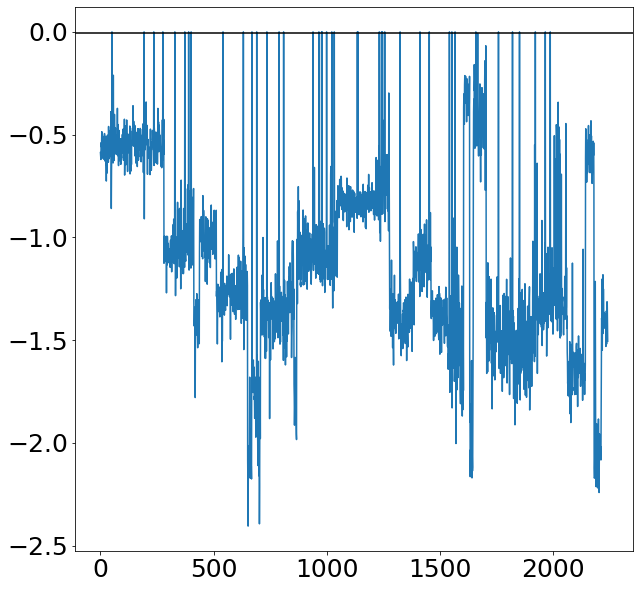

In [11]:
all_sal_feh = np.array([])
for i in range(len(gcsdr17)):
    cnalpha = np.array([gcsdr17['C_FE'][i],gcsdr17['N_FE'][i],gcsdr17['O_FE'][i],gcsdr17['MG_FE'][i],
                        gcsdr17['SI_FE'][i],gcsdr17['S_FE'][i],gcsdr17['CA_FE'][i],gcsdr17['TI_FE'][i]])
    
#     all_sal_feh = np.append(all_sal_feh,salaris(gcsdr17['FE_H'][i],cnalpha))
    all_sal_feh = np.append(all_sal_feh,salaris(shiftfeh[i],cnalpha))
    
plt.figure(figsize=[10,10])
plt.plot(all_sal_feh)
plt.axhline(-0.005,c='k')

In [12]:
### VandenBerg et al. Salaris corrected [Fe/H]

vanfeh = 999999.0*np.ones(len(gcsdr17))

for i in range(len(gcs_clus)):
    clus = np.where(gcs['CLUSTER']==gcs_clus[i])
    vanfeh[clus] = vanden_feh[i]
    
salvanfeh = 999999.0*np.ones(len(vanden_feh))
for i in tqdm_notebook(range(len(gcs_clus))):
    clus = np.where(gcs['CLUSTER']==gcs_clus[i])
    clusfeh = []
    for j in tqdm_notebook(range(len(np.squeeze(clus))),leave=False):
        cnalpha = np.array([gcsdr17[clus]['C_FE'][j],gcsdr17[clus]['N_FE'][j],gcsdr17[clus]['O_FE'][j],
                            gcsdr17[clus]['MG_FE'][j],gcsdr17[clus]['SI_FE'][j],gcsdr17[clus]['S_FE'][j],
                            gcsdr17[clus]['CA_FE'][j],gcsdr17[clus]['TI_FE'][j]])
        
        clusfeh.append(salaris(vanden_feh[i],cnalpha))
        
    salvanfeh[i] = np.nanmedian(clusfeh)

print(salvanfeh)


[-0.49629611 -1.37258468 -0.72299536 -1.08793535 -1.42216128 -2.02963541
 -1.32601745 -1.51373837 -1.44001048 -1.37642037 -0.8821581  -1.13907402
 -1.84903555 -1.32598783 -1.72810988 -2.08272616 -0.57838252 -1.4564343
 -2.04507515 -1.00381372 -1.04205799 -1.0504233  -1.3608809  -1.16872294
 -2.09491288 -2.24582809 -0.13164551 -0.63529077 -1.34861413 -0.35580541]


In [13]:
salvanfeh

array([-0.49629611, -1.37258468, -0.72299536, -1.08793535, -1.42216128,
       -2.02963541, -1.32601745, -1.51373837, -1.44001048, -1.37642037,
       -0.8821581 , -1.13907402, -1.84903555, -1.32598783, -1.72810988,
       -2.08272616, -0.57838252, -1.4564343 , -2.04507515, -1.00381372,
       -1.04205799, -1.0504233 , -1.3608809 , -1.16872294, -2.09491288,
       -2.24582809, -0.13164551, -0.63529077, -1.34861413, -0.35580541])

# Gaia Errors

In [14]:
from scipy.stats import binned_statistic
gaiaedr3 = fits.getdata('/Users/joshuapovick/Desktop/Research/gaia/GAIAEDR3allStar.fits.gz')

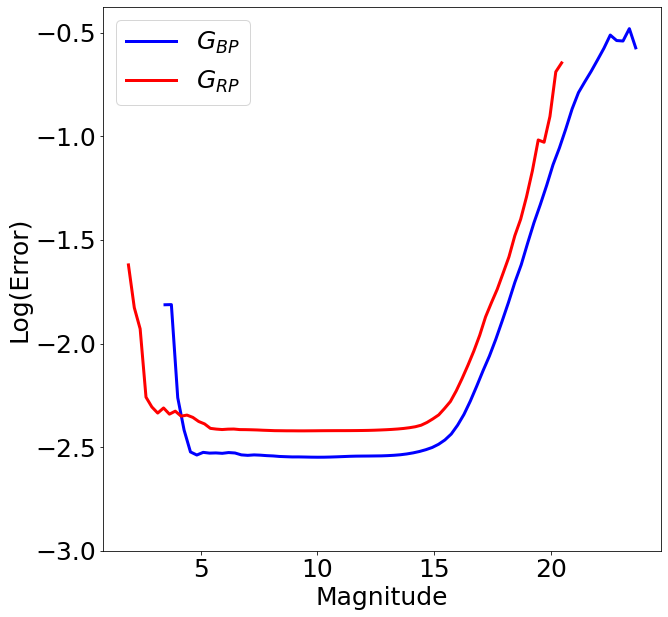

In [15]:
binnum = 75

### BP
bp_fin = np.where(np.isfinite(gaiaedr3['phot_bp_mean_mag'])==True)

bpmin = min(gaiaedr3['phot_bp_mean_mag'][bp_fin])
bpmax = max(gaiaedr3['phot_bp_mean_mag'][bp_fin])

bpdiff = bpmax-bpmin
bpfluxerr = (2.5*0.434)/gaiaedr3['phot_bp_mean_flux_over_error'][bp_fin]
bpmagerr = np.sqrt((bpfluxerr)**2+0.0027901700**2)

bpbin ,_,_ = binned_statistic(gaiaedr3['phot_bp_mean_mag'][bp_fin],np.log10(bpmagerr),'median',bins=binnum)

### RP 
rp_fin = np.where(np.isfinite(gaiaedr3['phot_rp_mean_mag'])==True)

rpmin = min(gaiaedr3['phot_rp_mean_mag'][rp_fin])
rpmax = max(gaiaedr3['phot_rp_mean_mag'][rp_fin])

rpdiff = rpmax-rpmin
rpfluxerr = (2.5*0.434)/gaiaedr3['phot_rp_mean_flux_over_error'][rp_fin]
rpmagerr = np.sqrt((rpfluxerr)**2+0.0037793818**2)

rpbin ,_,_ = binned_statistic(gaiaedr3['phot_rp_mean_mag'][rp_fin],np.log10(rpmagerr),'median',bins=binnum)

### Plot
plt.figure(figsize=[10,10])
plt.plot(np.arange(bpmin,bpmax,bpdiff/binnum),bpbin,lw=3.0,c='blue',label=r'$G_{BP}$')
plt.plot(np.arange(rpmin,rpmax,rpdiff/binnum),rpbin,lw=3.0,c='red',label=r'$G_{RP}$')
plt.legend()
plt.ylim(bottom=-3.0)
plt.xlabel('Magnitude')
plt.ylabel('Log(Error)');

In [16]:
bperrfunc = IUS(np.arange(bpmin,bpmax,bpdiff/binnum),bpbin)
rperrfunc = IUS(np.arange(rpmin,rpmax,rpdiff/binnum),rpbin)

bperr = 10**bperrfunc(gcsdr17['GAIAEDR3_PHOT_BP_MEAN_MAG'])
rperr = 10**rperrfunc(gcsdr17['GAIAEDR3_PHOT_RP_MEAN_MAG'])

# Offsets

In [17]:
gcs_ext = 999999.0*np.ones(len(gcsdr17))
gcs_dist = 999999.0*np.ones(len(gcsdr17))
for i in range(len(harris_ext)):
    clus = np.where(gcs['CLUSTER']==gcs_clus[i])
    gcs_ext[clus] = harris_ext[i]
    gcs_dist[clus] = harris_dist[i]

In [18]:
gcsabsBP = gcsdr17['GAIAEDR3_PHOT_BP_MEAN_MAG']-5*np.log10(gcs_dist)+5.0-gcs_ext*abp_ebv
gcsabsRP = gcsdr17['GAIAEDR3_PHOT_RP_MEAN_MAG']-5*np.log10(gcs_dist)+5.0-gcs_ext*arp_ebv
gcsabsJ = gcsdr17['J']-5*np.log10(gcs_dist)+5.0-gcs_ext*aj_ebv
gcsabsH = gcsdr17['H']-5*np.log10(gcs_dist)+5.0-gcs_ext*ah_ebv
gcsabsK = gcsdr17['K']-5*np.log10(gcs_dist)+5.0-gcs_ext*ak_ebv

In [19]:
bp_shifts = []
rp_shifts = []
j_shifts = []
h_shifts = []
k_shifts = []
for i in tqdm_notebook(range(len(gcs_clus))):
    bpoff = []
    rpoff = []
    joff = []
    hoff = []
    koff = []
    
    clus = np.where(gcs['CLUSTER']==gcs_clus[i])
    isopick = massive[np.where((massive['logAge']==closest(massive['logAge'],np.log10(vanden_age[i]*10**9)))&
                               (massive['MH']==closest(massive['MH'],vanden_feh[i])))]
    sorte = isopick[np.argsort(isopick['logTe'])]
    
    bp_spl = IUS(10**sorte['logTe'][::2],sorte['G_BPmag'][::2])
    rp_spl = IUS(10**sorte['logTe'][::2],sorte['G_RPmag'][::2])
    j_spl = IUS(10**sorte['logTe'][::2],sorte['Jmag'][::2])
    h_spl = IUS(10**sorte['logTe'][::2],sorte['Hmag'][::2])
    k_spl = IUS(10**sorte['logTe'][::2],sorte['Ksmag'][::2])
        
    bp_shifts.append(bp_spl(gcsdr17['TEFF'][clus])-gcsabsBP[clus])
    rp_shifts.append(rp_spl(gcsdr17['TEFF'][clus])-gcsabsRP[clus])
    j_shifts.append(j_spl(gcsdr17['TEFF'][clus])-gcsabsJ[clus])
    h_shifts.append(h_spl(gcsdr17['TEFF'][clus])-gcsabsH[clus])
    k_shifts.append(k_spl(gcsdr17['TEFF'][clus])-gcsabsK[clus])

In [20]:
len(bp_shifts)
len(rp_shifts)

30

In [21]:
bpoff = np.array([])
rpoff = np.array([])
joff = np.array([])
hoff = np.array([])
koff = np.array([])

for i in range(30):
    bpoff = np.append(bpoff,np.nanmedian(bp_shifts[i]))
    rpoff = np.append(rpoff,np.nanmedian(rp_shifts[i]))
    joff = np.append(joff,np.nanmedian(j_shifts[i]))
    hoff = np.append(hoff,np.nanmedian(h_shifts[i]))
    koff = np.append(koff,np.nanmedian(k_shifts[i]))

In [22]:
[harris_ext*abp_ebv, harris_ext*arp_ebv, harris_ext*aj_ebv, harris_ext*ah_ebv, harris_ext*ak_ebv]

[array([0.1323188 , 0.92623163, 1.09163014, 0.62851432, 0.0661594 ,
        0.33079701, 1.25702864, 0.19847821, 1.12470984, 0.0330797 ,
        1.15778954, 0.0992391 , 0.0661594 , 0.49619552, 0.26463761,
        0.16539851, 0.82699253, 0.0330797 , 0.0661594 , 0.0661594 ,
        0.72775343, 0.0992391 , 0.79391283, 0.16539851, 0.0330797 ,
        0.        , 1.78630386, 1.22394894, 0.1323188 , 2.54713699]),
 array([0.08363102, 0.58541714, 0.68995592, 0.39724735, 0.04181551,
        0.20907755, 0.79449469, 0.12544653, 0.71086367, 0.02090776,
        0.73177143, 0.06272327, 0.04181551, 0.31361633, 0.16726204,
        0.10453878, 0.52269388, 0.02090776, 0.04181551, 0.04181551,
        0.45997061, 0.06272327, 0.50178612, 0.10453878, 0.02090776,
        0.        , 1.12901877, 0.77358694, 0.08363102, 1.60989714]),
 array([0.03721313, 0.26049189, 0.30700829, 0.17676235, 0.01860656,
        0.09303282, 0.3535247 , 0.05581969, 0.31631157, 0.00930328,
        0.32561486, 0.02790984, 0.01860656, 

In [23]:
from astropy.io import fits
import numpy as np
c1 = fits.Column(name='CLUSTER', array=gcs_clus, format='10A')
c2 = fits.Column(name='HARRIS_DIST', array=harris_dist, format='E')
c3 = fits.Column(name='HARRIS_EBV', array=harris_ext, format='E')
c12 = fits.Column(name='HARRIS_ABP', array=harris_ext*abp_ebv, format='E')
c13 = fits.Column(name='HARRIS_ARP', array=harris_ext*arp_ebv, format='E')
c14 = fits.Column(name='HARRIS_AJ', array=harris_ext*aj_ebv, format='E')
c15 = fits.Column(name='HARRIS_AH', array=harris_ext*ah_ebv, format='E')
c16 = fits.Column(name='HARRIS_AK', array=harris_ext*ak_ebv, format='E')
c4 = fits.Column(name='HARRIS_FE_H', array=harris_feh, format='E')
c5 = fits.Column(name='VANDEN_FE_H', array=vanden_feh, format='E')
c6 = fits.Column(name='VANDEN_AGE', array=vanden_age, format='E')
c7 = fits.Column(name='BPOFF', array=bpoff, format='E')
c8 = fits.Column(name='RPOFF', array=rpoff, format='E')
c9 = fits.Column(name='JOFF', array=joff, format='E')
c10 = fits.Column(name='HOFF', array=hoff, format='E')
c11 = fits.Column(name='KOFF', array=koff, format='E')
t = fits.BinTableHDU.from_columns([c1,c2,c3,c12,c13,c14,c15,c16,c4,c5,c6,c7,c8,c9,c10,c11])
t.writeto('sysoffsets.fits',overwrite=True)

In [24]:
# test = fits.getdata('sysoffsets.fits',0)
# Table(test)

(array([0.82912624, 1.38187706, 1.10550165, 0.27637541, 1.38187706,
        0.55275082, 1.38187706, 1.10550165, 0.        , 0.27637541]),
 array([-0.61842754, -0.49781865, -0.37720975, -0.25660085, -0.13599196,
        -0.01538306,  0.10522584,  0.22583473,  0.34644363,  0.46705252,
         0.58766142]),
 <a list of 1 Patch objects>)

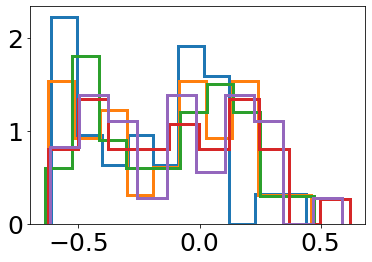

In [25]:
plt.hist(bpoff,histtype='step',lw=3.0,density=True)
plt.hist(rpoff,histtype='step',lw=3.0,density=True)
plt.hist(joff,histtype='step',lw=3.0,density=True)
plt.hist(hoff,histtype='step',lw=3.0,density=True)
plt.hist(koff,histtype='step',lw=3.0,density=True)

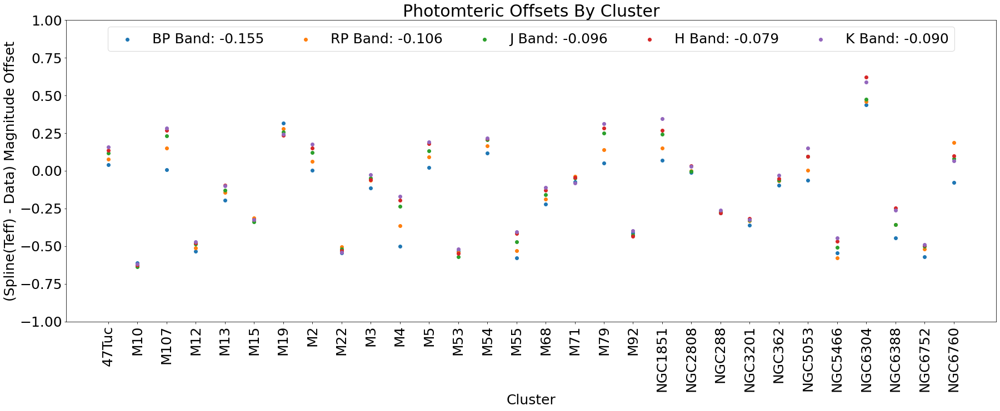

In [26]:
plt.figure(figsize=[30,10])
plt.scatter(range(30),bpoff,label='BP Band: {:.3f}'.format(np.nanmedian(bpoff)))
plt.scatter(range(30),rpoff,label='RP Band: {:.3f}'.format(np.nanmedian(rpoff)))
plt.scatter(range(30),joff,label='J Band: {:.3f}'.format(np.nanmedian(joff)))
plt.scatter(range(30),hoff,label='H Band: {:.3f}'.format(np.nanmedian(hoff)))
plt.scatter(range(30),koff,label='K Band: {:.3f}'.format(np.nanmedian(koff)))
plt.legend(ncol=5,fancybox=True,loc='upper center')
plt.ylim(-1.0,1.0)
plt.xticks(range(30),labels=list(gcs_clus),rotation='vertical')
plt.title(r'Photomteric Offsets By Cluster')
plt.ylabel(r'(Spline(Teff) - Data) Magnitude Offset')
plt.xlabel(r'Cluster')
plt.savefig(r'../plots/offsets.pdf',bbox_inches='tight')
plt.show()

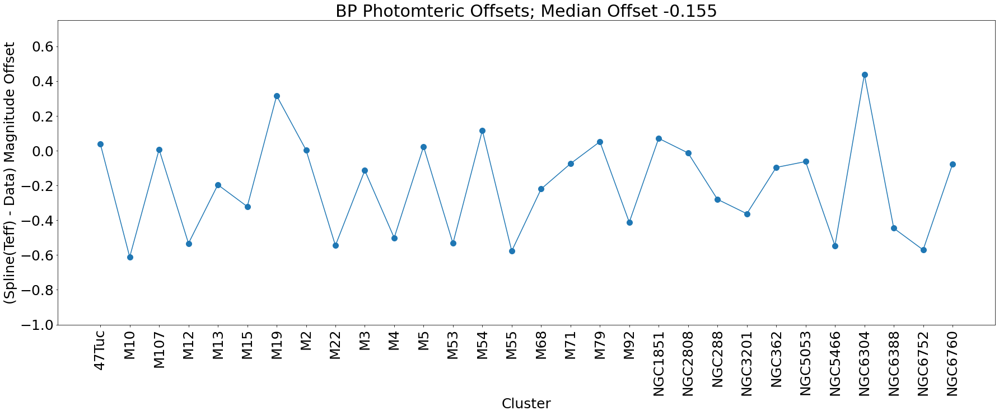

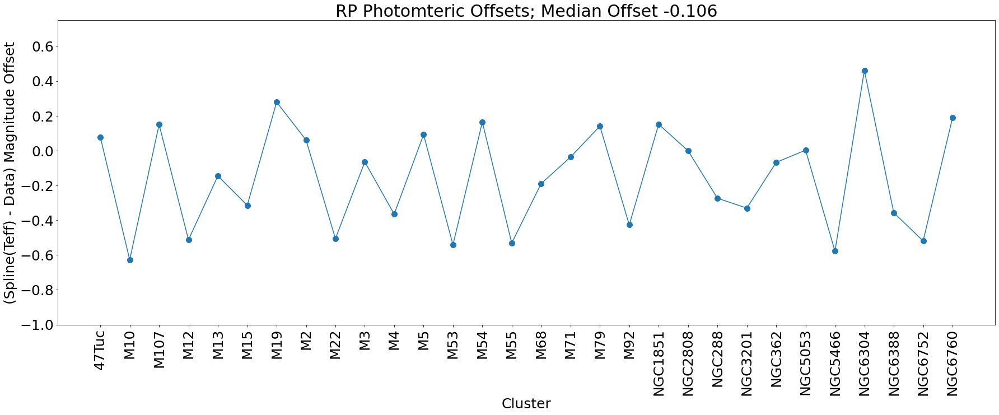

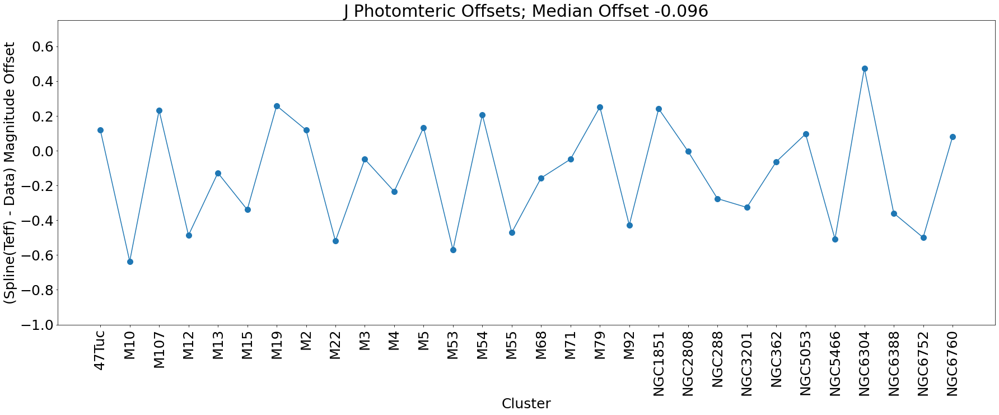

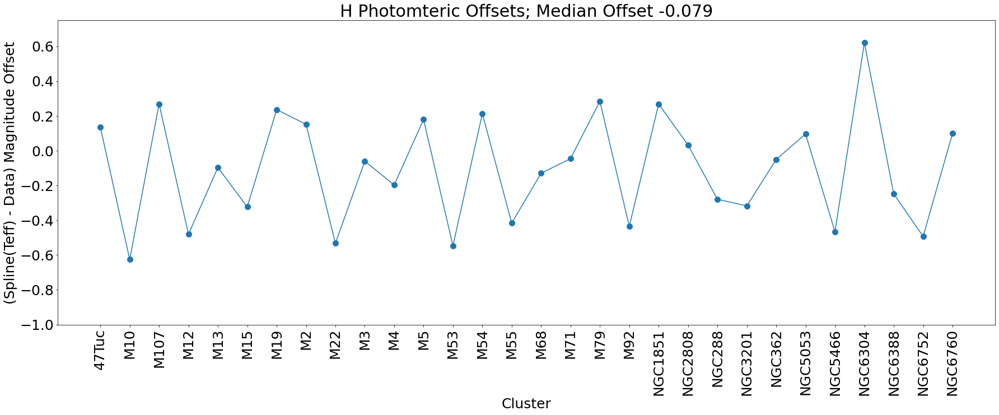

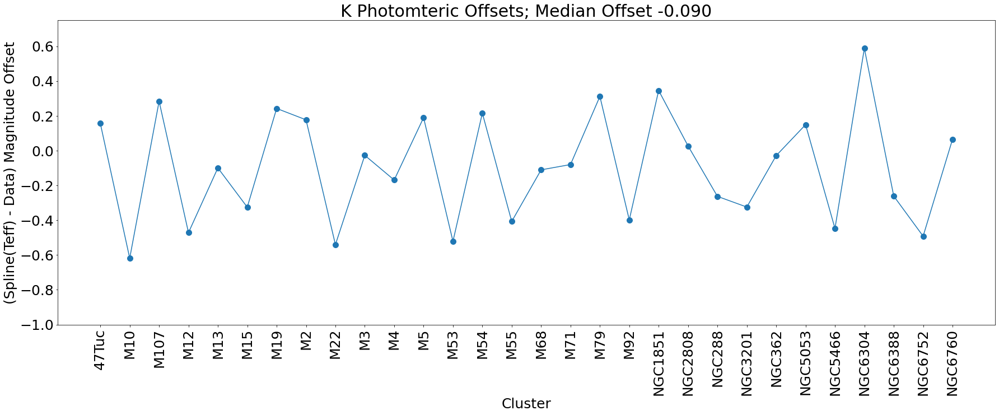

In [27]:
labs = ['BP','RP','J','H','K']
offs = [bpoff,rpoff,joff,hoff,koff]

for i in range(len(labs)):
    plt.figure(figsize=[30,10])
    plt.scatter(range(30),offs[i],s=100)
    plt.plot(range(30),offs[i])
    plt.ylim(-1.0,0.75)
    plt.xticks(range(30),labels=list(gcs_clus),rotation='vertical')
    plt.title(r'{} Photomteric Offsets; Median Offset {:.3f}'.format(labs[i],np.nanmedian(offs[i])))
    plt.ylabel(r'(Spline(Teff) - Data) Magnitude Offset')
    plt.xlabel(r'Cluster')
    plt.savefig('{}offsetplot.pdf'.format(labs[i]),bbox_inches='tight')
    plt.show()

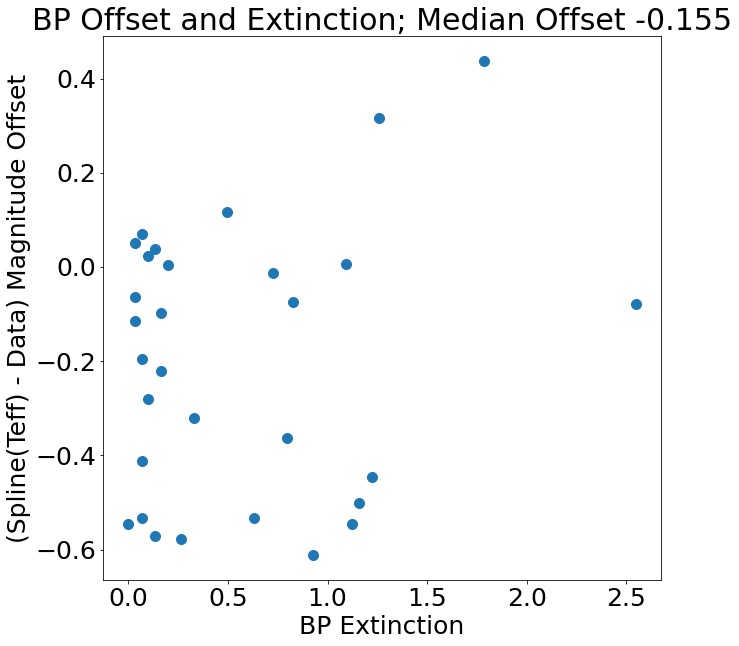

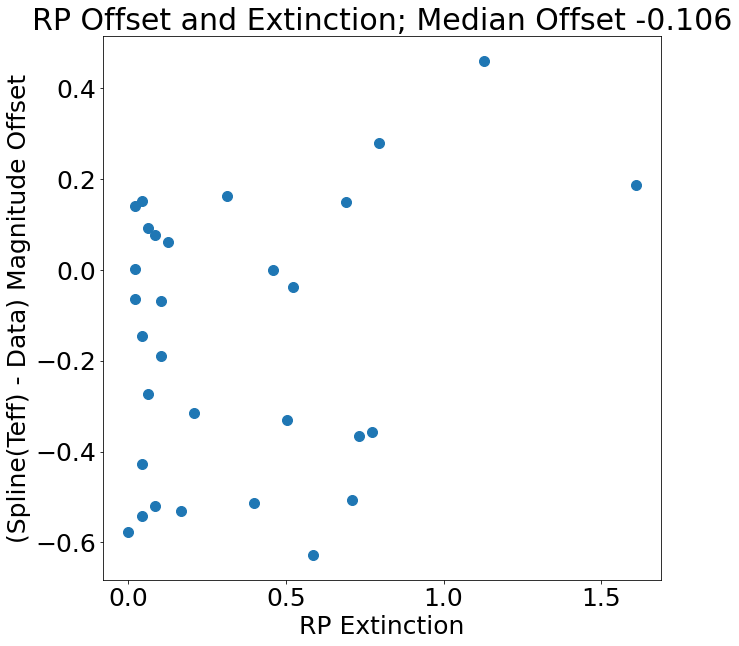

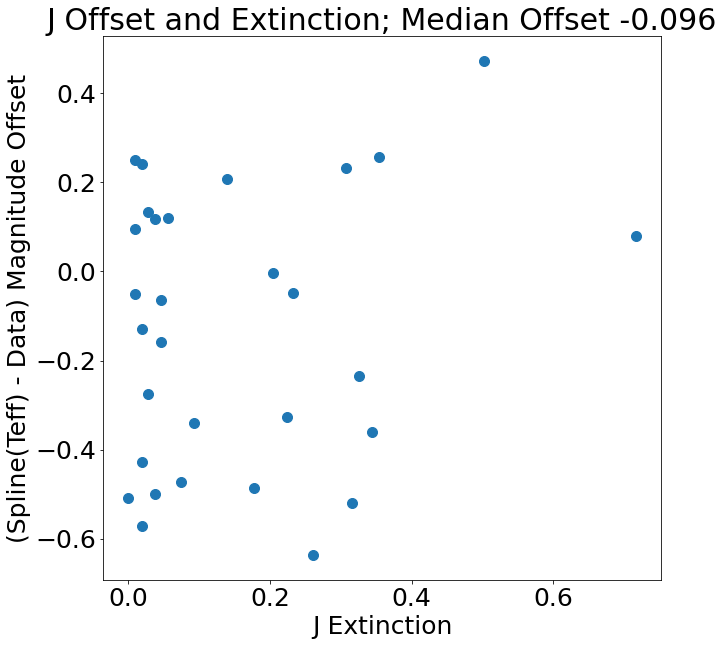

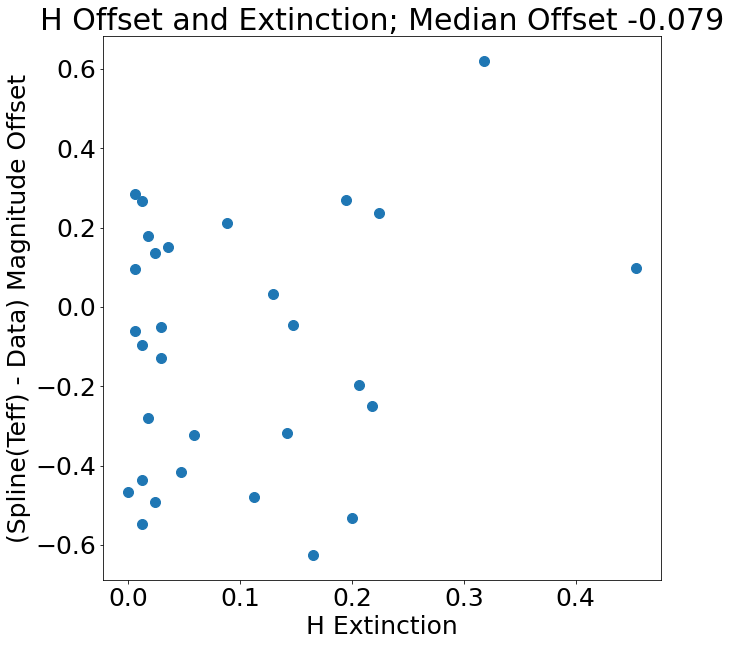

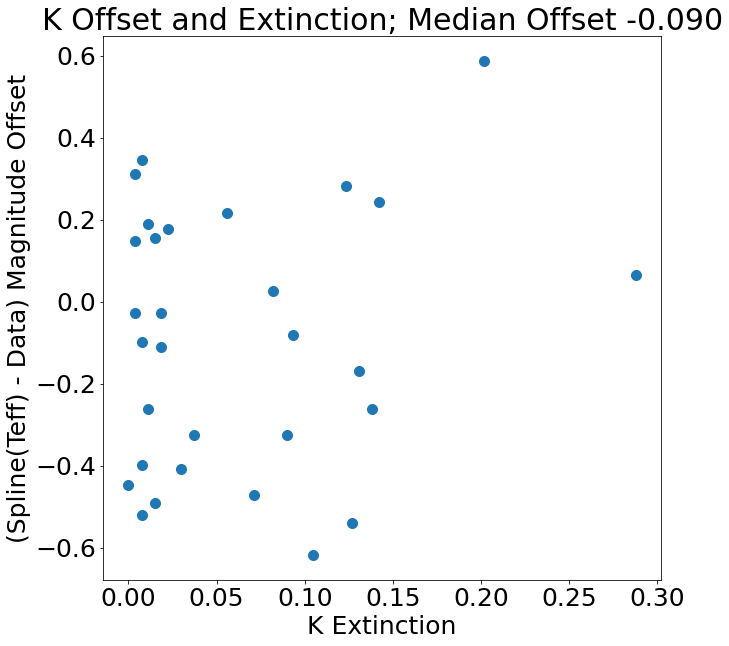

In [28]:
labs = ['BP','RP','J','H','K']
offs = [bpoff,rpoff,joff,hoff,koff]
exts = [harris_ext*abp_ebv,harris_ext*arp_ebv,harris_ext*aj_ebv,harris_ext*ah_ebv,harris_ext*ak_ebv]

for i in range(len(labs)):
    plt.figure(figsize=[10,10])
    plt.scatter(exts[i],offs[i],s=100)
    plt.title(r'{} Offset and Extinction; Median Offset {:.3f}'.format(labs[i],np.nanmedian(offs[i])))
    plt.ylabel(r'(Spline(Teff) - Data) Magnitude Offset')
    plt.xlabel(r'{} Extinction'.format(labs[i]))
    plt.savefig('{}OffsetExtplot.pdf'.format(labs[i]),bbox_inches='tight')
    plt.show()

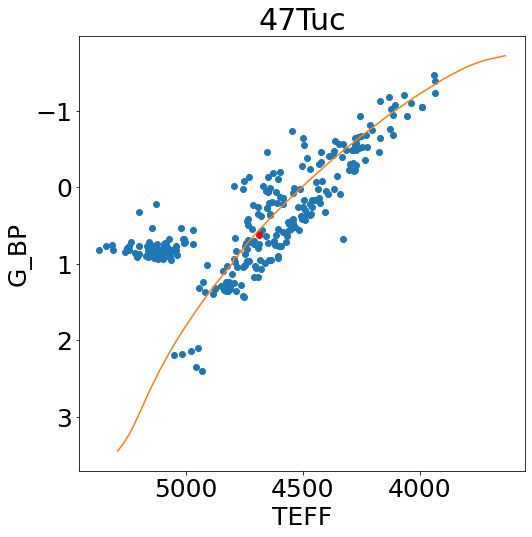

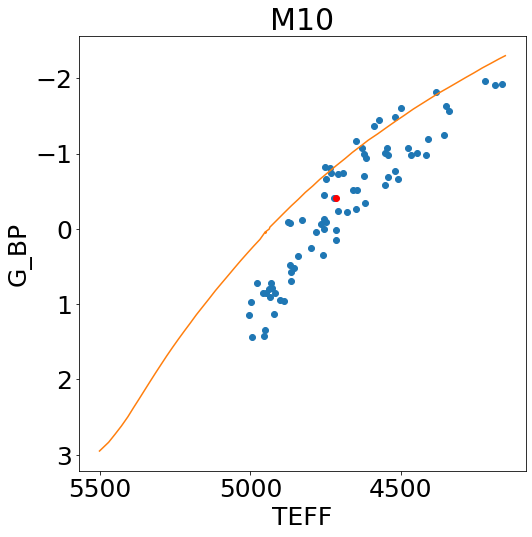

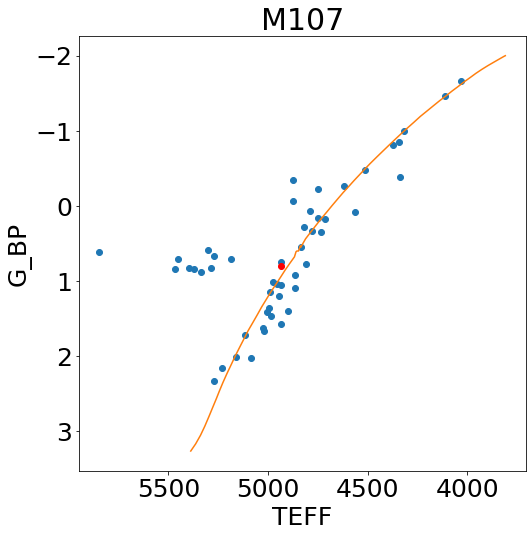

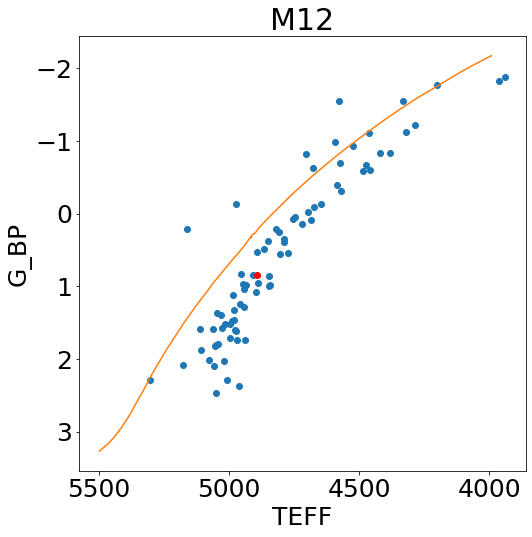

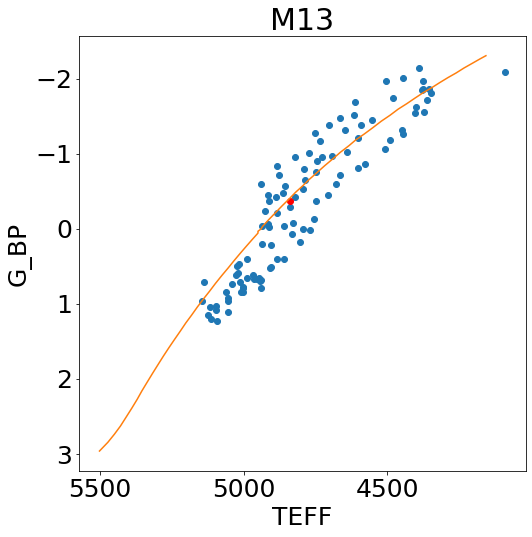

...

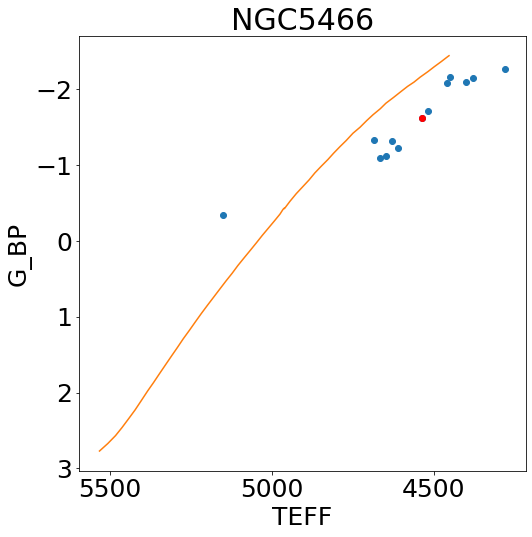

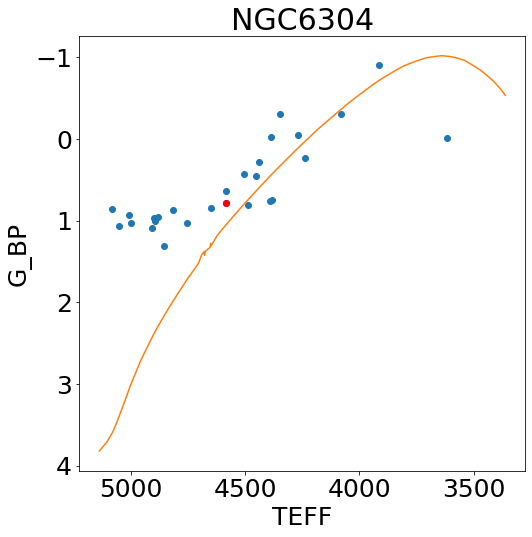

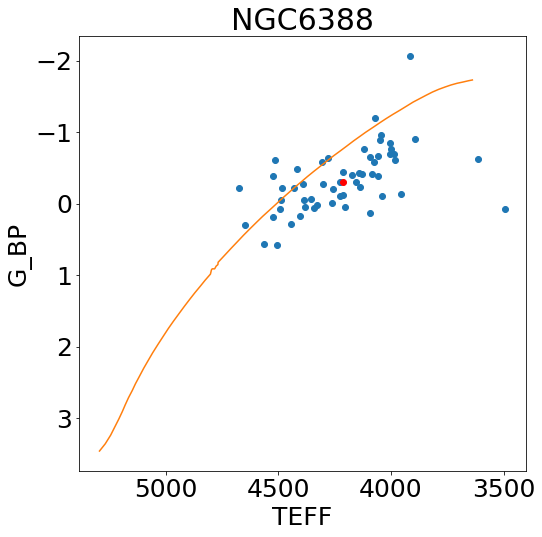

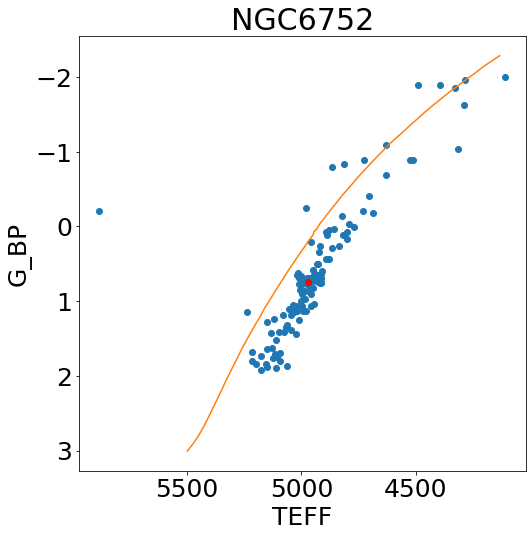

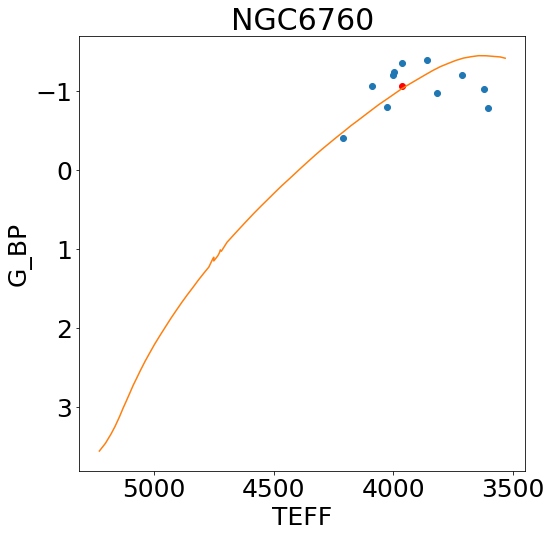

In [29]:
bpoffset = 999999.0*np.ones(len(gcs_clus))
for i in tqdm_notebook(range(len(gcs_clus))):
    clus = np.where(gcs['CLUSTER']==gcs_clus[i])
    isopick = massive[np.where((massive['logAge']==closest(massive['logAge'],np.log10(vanden_age[i]*10**9)))&
                               (massive['MH']==closest(massive['MH'],vanden_feh[i])))]
    sorte = np.argsort(isopick['logTe'])
    mag_spl = IUS(10**isopick['logTe'][sorte][::2],isopick['G_BPmag'][sorte][::2])
    bpoffset[i] = mag_spl(np.nanmedian(gcsdr17['TEFF'][clus]))-np.nanmedian(gcsabsBP[clus])

    plt.figure(figsize=[8,8])
    plt.scatter(gcsdr17['TEFF'][clus],gcsabsBP[clus])
    plt.plot(10**isopick['logTe'][sorte],isopick['G_BPmag'][sorte],c='tab:orange')
    plt.scatter(np.nanmedian(gcsdr17['TEFF'][clus]),np.nanmedian(gcsabsBP[clus]),c='r')
    plt.gca().invert_yaxis()
    plt.gca().invert_xaxis()
    plt.title(r'{}'.format(gcs_clus[i]))
    plt.xlabel(r'TEFF')
    plt.ylabel(r'G_BP')
    plt.show()

Text(0, 0.5, 'RP, J, H, KOFF')

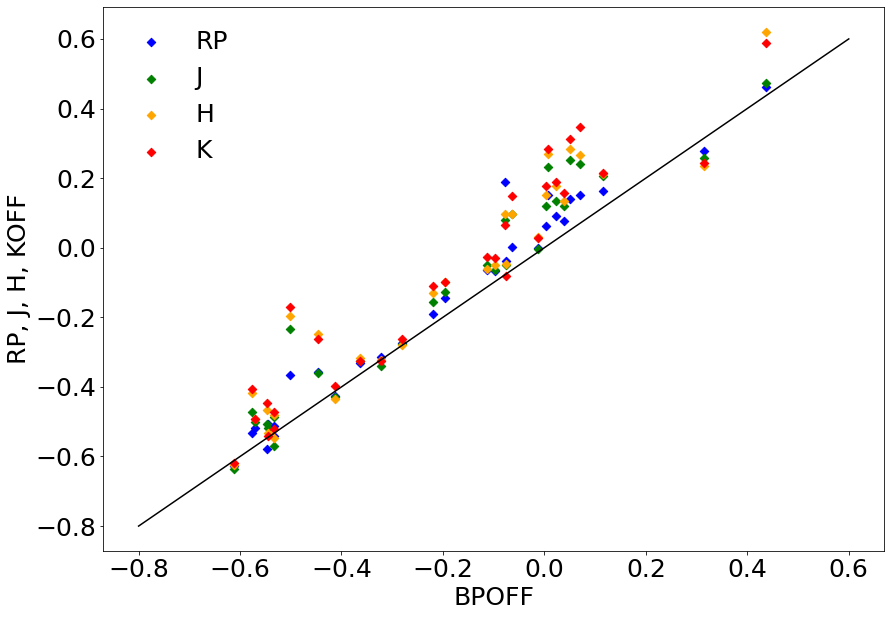

In [30]:
plt.figure(figsize=[14,10])
plt.scatter(bpoff,rpoff,marker='D',c='b',label='RP')
plt.scatter(bpoff,joff,marker='D',c='g',label='J')
plt.scatter(bpoff,hoff,marker='D',c='orange',label='H')
plt.scatter(bpoff,koff,marker='D',c='r',label='K')
plt.legend(frameon=False)
plt.plot([-0.8,0.6],[-0.8,0.6],c='k')
plt.xlabel('BPOFF')
plt.ylabel('RP, J, H, KOFF')

<font size='15'> 
    <b>
        Synthetic Data Offset
    </b>
</font>

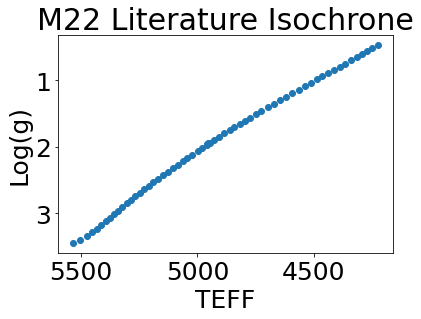

In [31]:
m22_harfeh = harris_feh[np.where(gcs_clus=='M22')]
m22_vanfeh = vanden_feh[np.where(gcs_clus=='M22')]
isochr = massive[np.where((massive['MH']==closest(massive['MH'],m22_harfeh))&
                          (massive['logAge']==closest(massive['logAge'],np.log10(12.5*10**9))))]

plt.scatter(10**isochr['logTe'],isochr['logg'])
plt.gca().invert_xaxis()
plt.gca().invert_yaxis()
plt.xlabel('TEFF')
plt.ylabel('Log(g)')
plt.title('M22 Literature Isochrone');

In [32]:
# synbpmagerr = np.random.normal(np.nanmedian(bperr),mad(bperr),len(isochr))
# synrpmagerr = np.random.normal(np.nanmedian(rperr),mad(rperr),len(isochr))
# synjmagerr = np.random.normal(np.nanmedian(gcsdr17['J_ERR']),mad(gcsdr17['J_ERR']),len(isochr))
# synhmagerr = np.random.normal(np.nanmedian(gcsdr17['H_ERR']),mad(gcsdr17['H_ERR']),len(isochr))
# synkmagerr = np.random.normal(np.nanmedian(gcsdr17['K_ERR']),mad(gcsdr17['K_ERR']),len(isochr))

In [33]:
### Spectroscopic
synteff = np.random.normal(10**isochr['logTe'],np.nanmedian(gcsdr17['TEFF_ERR']),len(isochr))
synfeh = np.random.normal(m22_vanfeh,np.nanmedian(gcsdr17['FE_H_ERR']),len(isochr))

### With Extinction
synbpext = 999999.0*np.ones(len(isochr)) 
synrpext = 999999.0*np.ones(len(isochr)) 
synjext = 999999.0*np.ones(len(isochr)) 
synhext = 999999.0*np.ones(len(isochr)) 
synkext = 999999.0*np.ones(len(isochr))

# ## Random Distance Error 
# disterr = np.array([0.25,0.5,1.0,2.0,5.0])*1000

### Extinct Data
for i in range(len(isochr)):
    bpmag = (np.random.normal(isochr['G_BPmag'][i],np.nanmedian(bperr))+5*np.log10(3200)-5.0)
    rpmag = (np.random.normal(isochr['G_RPmag'][i],np.nanmedian(rperr))+5*np.log10(3200)-5.0)
    jmag = (np.random.normal(isochr['Jmag'][i],np.nanmedian(gcsdr17['J_ERR']))+5*np.log10(3200)-5.0)
    hmag = (np.random.normal(isochr['Hmag'][i],np.nanmedian(gcsdr17['H_ERR']))+5*np.log10(3200)-5.0)
    kmag = (np.random.normal(isochr['Ksmag'][i],np.nanmedian(gcsdr17['K_ERR']))+5*np.log10(3200)-5.0)
        
    # BP magnitudes
    if np.isfinite(bpmag)==True:
        synbpext[i] = bpmag+0.34*abp_ebv
    else:
        synbpext[i] = 999999.0

    # RP magnitudes
    if np.isfinite(rpmag)==True:
        synrpext[i] = rpmag+0.34*arp_ebv
    else:
        synrpext[i] = 999999.0

    # J magnitudes
    if np.isfinite(jmag)==True:
        synjext[i] = jmag+0.34*aj_ebv
    else:
        synjext[i] = 999999.0

    # H magnitudes
    if np.isfinite(hmag)==True:
        synhext[i] = hmag+0.34*ah_ebv
    else:
        synhext[i,j] = 999999.0

    # K magnitudes
    if np.isfinite(kmag)==True:
        synkext[i] = kmag+0.34*ak_ebv
    else:
        synkext[i] = 999999.0

(array([5., 2., 1., 2., 3., 3., 0., 3., 3., 4., 0., 2., 3., 2., 4., 1., 3.,
        0., 1., 2., 0., 3., 1., 0., 2.]),
 array([1203.89491134, 1357.73606664, 1511.57722194, 1665.41837724,
        1819.25953253, 1973.10068783, 2126.94184313, 2280.78299842,
        2434.62415372, 2588.46530902, 2742.30646431, 2896.14761961,
        3049.98877491, 3203.8299302 , 3357.6710855 , 3511.5122408 ,
        3665.35339609, 3819.19455139, 3973.03570669, 4126.87686199,
        4280.71801728, 4434.55917258, 4588.40032788, 4742.24148317,
        4896.08263847, 5049.92379377]),
 <a list of 25 Patch objects>)

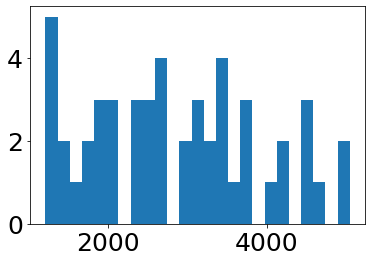

In [34]:
n=50
plt.hist(3200+np.random.uniform(0,2000,n)*(-1)**np.random.randint(2,size=n),bins=25)

(array([106.,  97.,  86.,  92.,  92.,  73.,  84.,  60.,  64.,  51.,  27.,
         34.,  19.,  27.,  18.,  13.,  21.,   9.,   9.,   5.,   6.,   4.,
          0.,   1.,   2.]),
 array([3200.7839736 , 3237.84618483, 3274.90839606, 3311.9706073 ,
        3349.03281853, 3386.09502976, 3423.15724099, 3460.21945222,
        3497.28166346, 3534.34387469, 3571.40608592, 3608.46829715,
        3645.53050838, 3682.59271962, 3719.65493085, 3756.71714208,
        3793.77935331, 3830.84156455, 3867.90377578, 3904.96598701,
        3942.02819824, 3979.09040947, 4016.15262071, 4053.21483194,
        4090.27704317, 4127.3392544 ]),
 <a list of 25 Patch objects>)

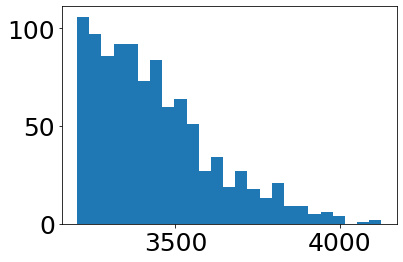

In [35]:
plt.hist(3200.+np.abs(np.random.normal(0,700/(2*np.sqrt(2*np.log(2))),1000)),bins=25)

In [36]:
700+3200
vanden_feh[np.where(gcs_clus=='M22')]

array([-1.7])

In [37]:
bpm22shifts = []
rpm22shifts = []
jm22shifts = []
hm22shifts = []
km22shifts = []

dshift = np.random.uniform(0,2000,len(isochr))*(-1)**np.random.randint(2,size=len(isochr))

for i in tqdm_notebook(range(len(isochr))):
    
    ### pick isochrone
    isopick = massive[np.where((massive['logAge']==closest(massive['logAge'],np.log10(12.5*10**9)))&
                               (massive['MH']==closest(massive['MH'],-1.7)))]
    sorte = isopick[np.argsort(isopick['logTe'])]
    
    ### interpolate isochrones
    bp_spl = IUS(10**sorte['logTe'][::2],sorte['G_BPmag'][::2])
    rp_spl = IUS(10**sorte['logTe'][::2],sorte['G_RPmag'][::2])
    j_spl = IUS(10**sorte['logTe'][::2],sorte['Jmag'][::2])
    h_spl = IUS(10**sorte['logTe'][::2],sorte['Hmag'][::2])
    k_spl = IUS(10**sorte['logTe'][::2],sorte['Ksmag'][::2])
    
    ### Calculate offsets    
    bpm22shifts.append(bp_spl(synteff)-(synbpext-0.34*abp_ebv-5*np.log10(3200+dshift[i])+5.0))
    rpm22shifts.append(rp_spl(synteff)-(synrpext-0.34*arp_ebv-5*np.log10(3200+dshift[i])+5.0))
    jm22shifts.append(j_spl(synteff)-(synjext-0.34*aj_ebv-5*np.log10(3200+dshift[i])+5.0))
    hm22shifts.append(h_spl(synteff)-(synhext-0.34*ah_ebv-5*np.log10(3200+dshift[i])+5.0))
    km22shifts.append(k_spl(synteff)-(synkext-0.34*ak_ebv-5*np.log10(3200+dshift[i])+5.0))

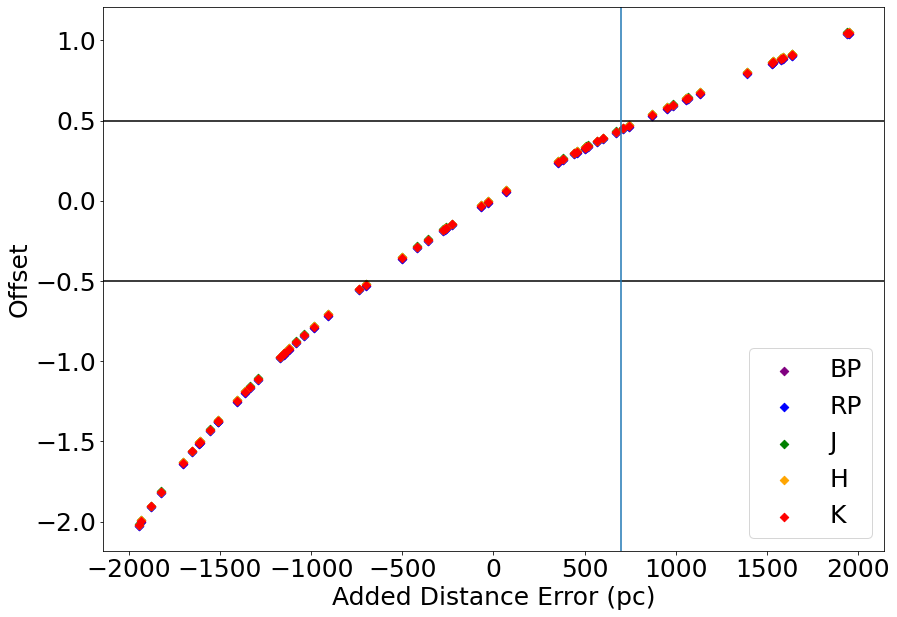

In [38]:
offsbp = 999999.0*np.ones(len(isochr))
offsrp = 999999.0*np.ones(len(isochr))
offsj = 999999.0*np.ones(len(isochr))
offsh = 999999.0*np.ones(len(isochr))
offsk = 999999.0*np.ones(len(isochr))

for i in range(len(isochr)):
    offsbp[i] = np.nanmedian(bpm22shifts[i])
    offsrp[i] = np.nanmedian(rpm22shifts[i])
    offsj[i] = np.nanmedian(jm22shifts[i])
    offsh[i] = np.nanmedian(hm22shifts[i])
    offsk[i] = np.nanmedian(km22shifts[i])
    
plt.figure(figsize=[14,10])
plt.scatter(dshift,offsbp,marker='D',c='purple',label='BP')
plt.scatter(dshift,offsrp,marker='D',c='blue',label='RP')
plt.scatter(dshift,offsj,marker='D',c='green',label='J')
plt.scatter(dshift,offsh,marker='D',c='orange',label='H')
plt.scatter(dshift,offsk,marker='D',c='red',label='K')

plt.axhline(-0.5,c='k')
plt.axhline(0.5,c='k')

plt.axvline(700)

plt.legend()
plt.xlabel('Added Distance Error (pc)')
plt.ylabel(r'Offset');

In [39]:
print(np.median(offsbp))
print(np.median(offsrp))
print(np.median(offsj))
print(np.median(offsh))
print(np.median(offsk))

-0.16470200682203834
-0.16529660771036925
-0.15402392914449886
-0.15585284104118236
-0.15882871313704727


Text(0, 0.5, 'RP, J, H, KOFF')

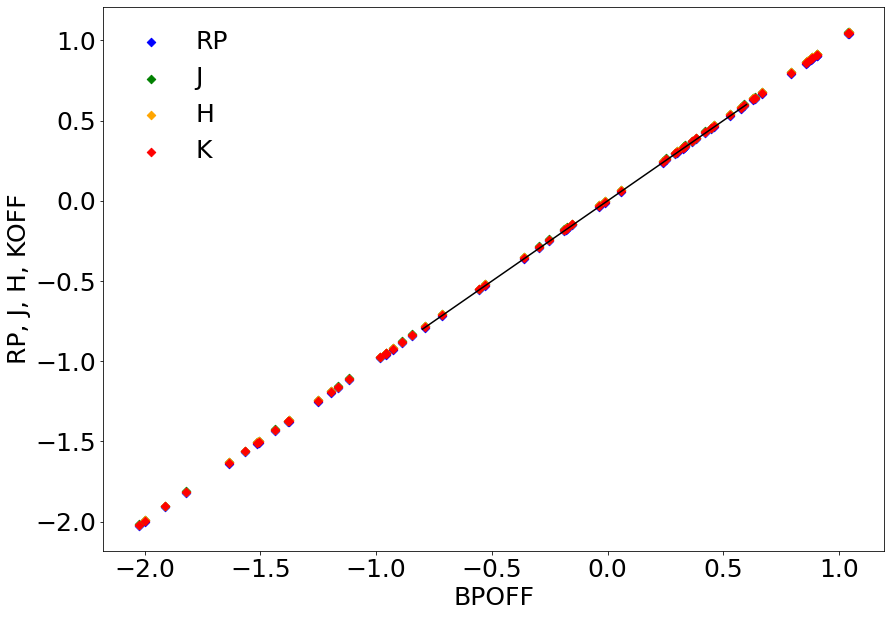

In [40]:
plt.figure(figsize=[14,10])
plt.scatter(offsbp,offsrp,marker='D',c='b',label='RP')
plt.scatter(offsbp,offsj,marker='D',c='g',label='J')
plt.scatter(offsbp,offsh,marker='D',c='orange',label='H')
plt.scatter(offsbp,offsk,marker='D',c='r',label='K')
plt.legend(frameon=False)
plt.plot([-0.8,0.6],[-0.8,0.6],c='k')
plt.xlabel('BPOFF')
plt.ylabel('RP, J, H, KOFF')

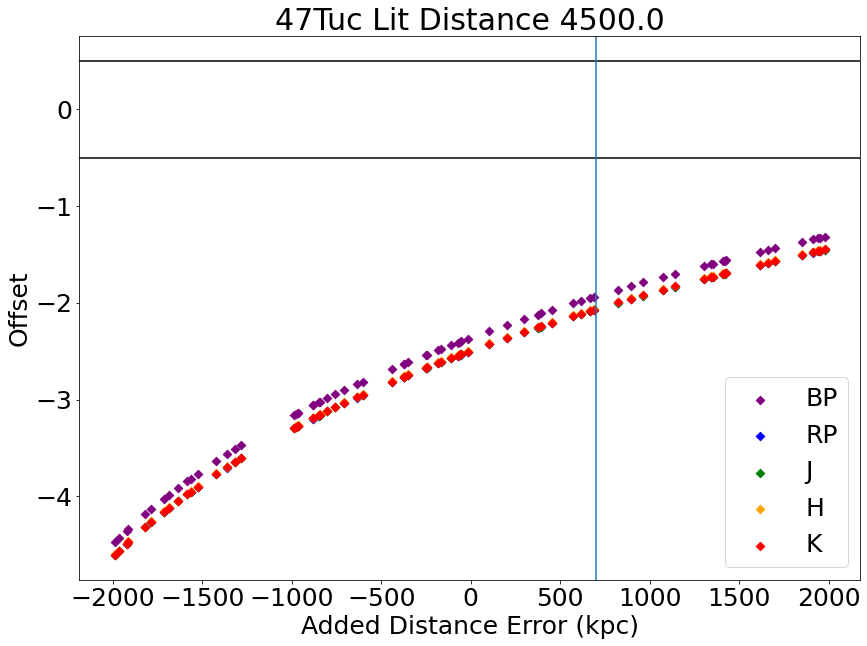

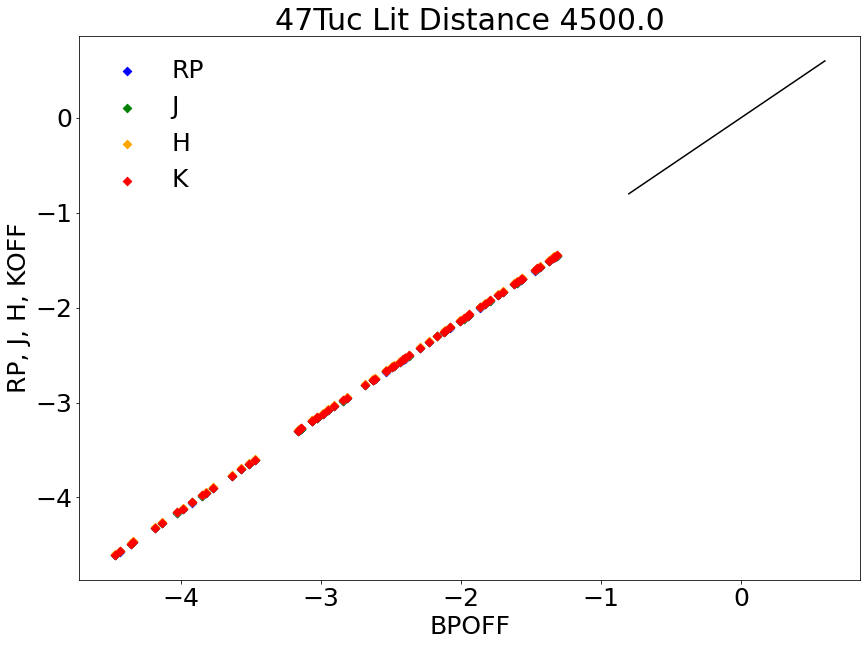

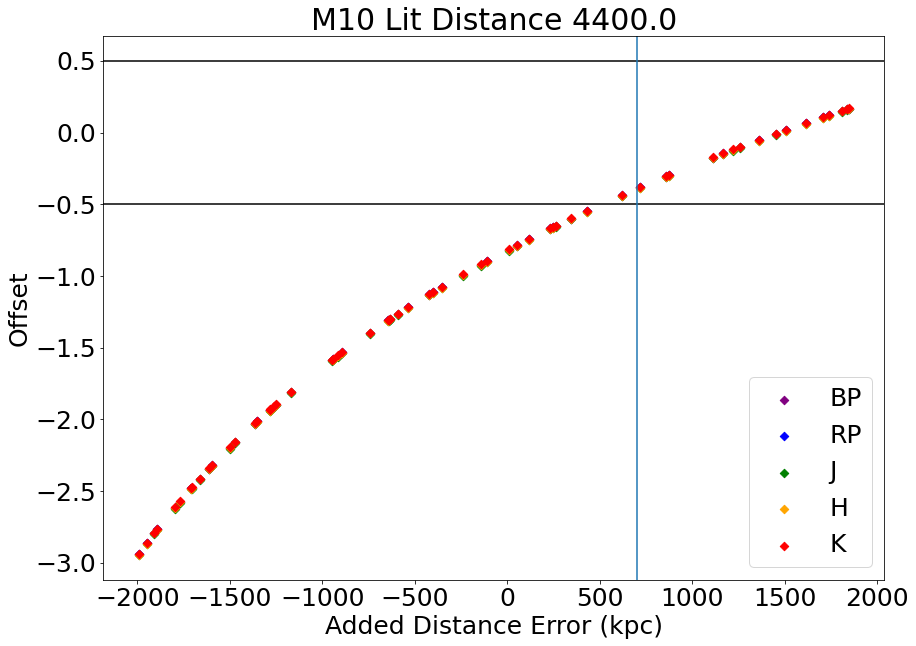

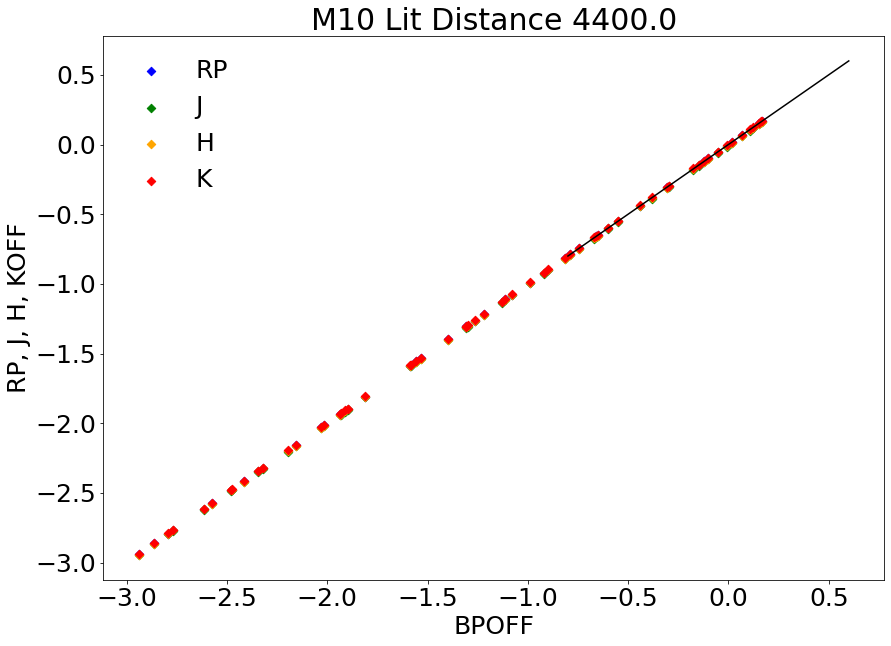

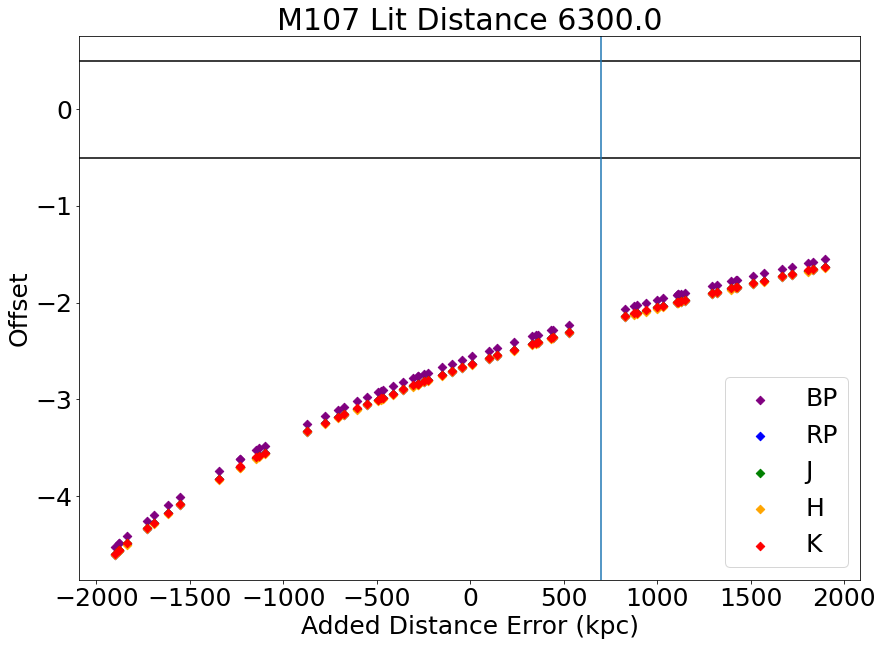

...

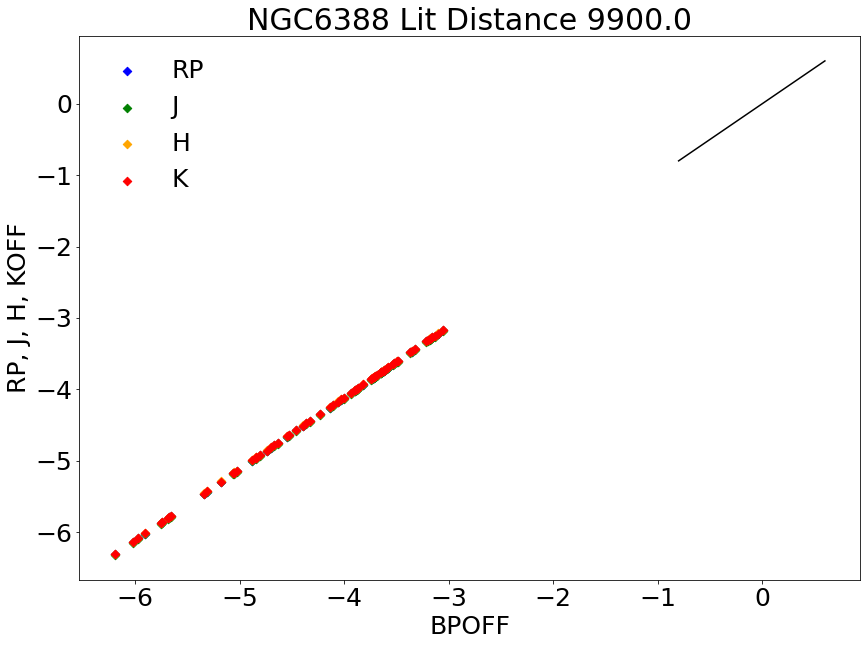

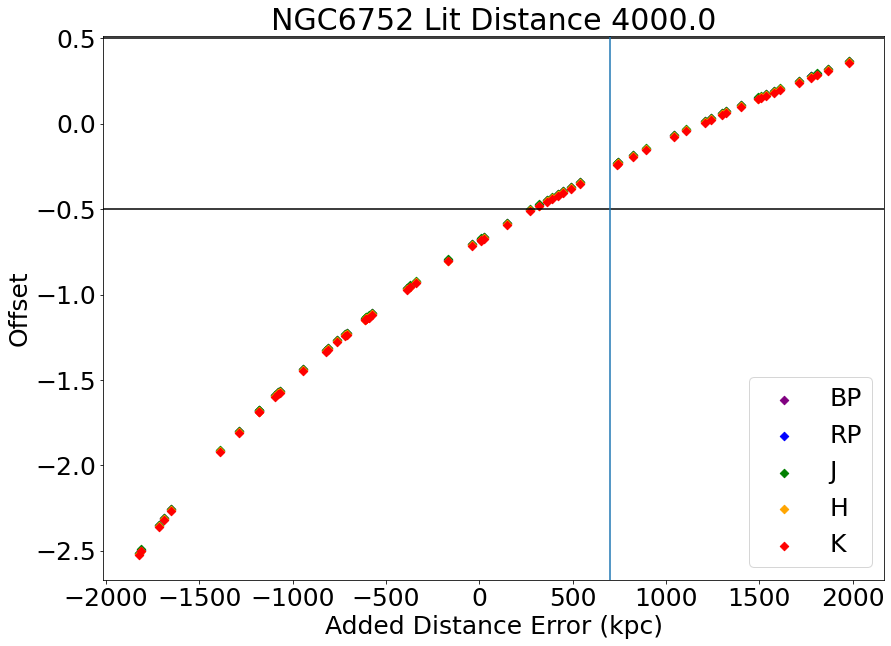

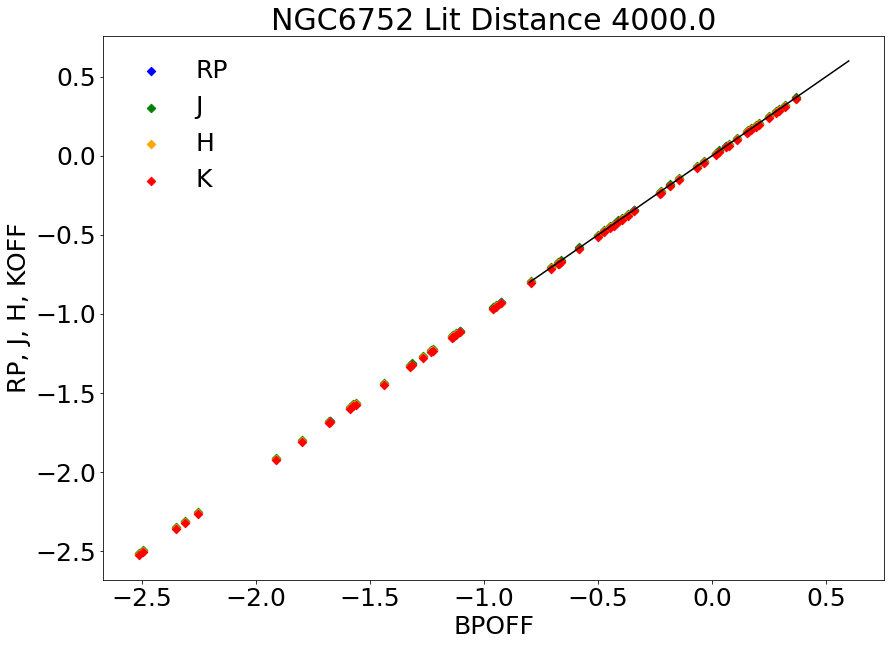

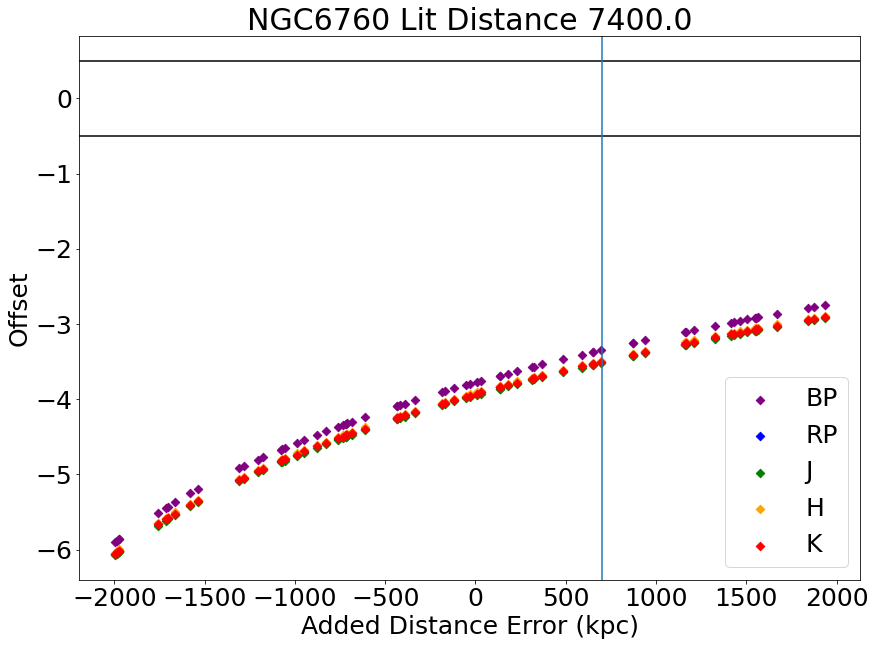

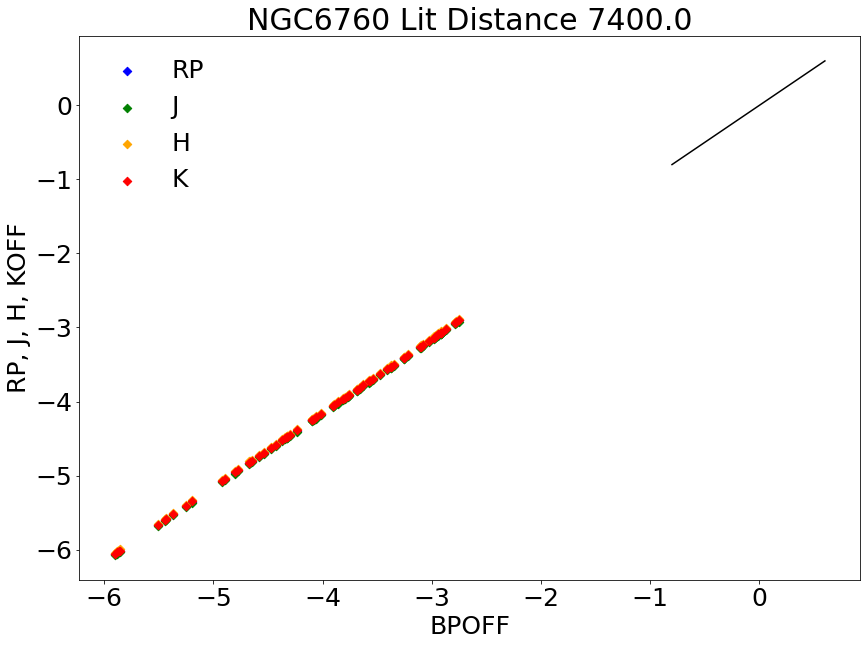

In [41]:
for i in tqdm_notebook(range(len(gcs_clus))):
    clus = np.where(gcs['CLUSTER']==gcs_clus[i])
    
    isopick = massive[np.where((massive['logAge']==closest(massive['logAge'],np.log10(vanden_age[i]*10**9)))&
                               (massive['MH']==closest(massive['MH'],vanden_feh[i])))]
    isopick = isopick[np.argsort(isopick['logTe'])]
    
    ### interpolate isochrones
    bp_spl = IUS(10**sorte['logTe'][::2],sorte['G_BPmag'][::2])
    rp_spl = IUS(10**sorte['logTe'][::2],sorte['G_RPmag'][::2])
    j_spl = IUS(10**sorte['logTe'][::2],sorte['Jmag'][::2])
    h_spl = IUS(10**sorte['logTe'][::2],sorte['Hmag'][::2])
    k_spl = IUS(10**sorte['logTe'][::2],sorte['Ksmag'][::2])
    
    ### distance "error" upto +/- 2000 pc
    dclusshift = np.random.uniform(0,2000,len(isopick))*(-1)**np.random.randint(2,size=len(isopick))
    
    ### Spectroscopic
    synteff = np.random.normal(10**isopick['logTe'],np.nanmedian(gcsdr17['TEFF_ERR']),len(isopick))
    synfeh = np.random.normal(m22_vanfeh,np.nanmedian(gcsdr17['FE_H_ERR']),len(isopick))

    ### With Extinction
    synbpext = 999999.0*np.ones(len(isopick)) 
    synrpext = 999999.0*np.ones(len(isopick)) 
    synjext = 999999.0*np.ones(len(isopick)) 
    synhext = 999999.0*np.ones(len(isopick)) 
    synkext = 999999.0*np.ones(len(isopick))
    
    ### Extinct Data
    for j in range(len(isopick)):
        bpmag = (np.random.normal(isopick['G_BPmag'][j],np.nanmedian(bperr))+5*np.log10(harris_dist[i])-5.0)
        rpmag = (np.random.normal(isopick['G_RPmag'][j],np.nanmedian(rperr))+5*np.log10(harris_dist[i])-5.0)
        jmag = (np.random.normal(isopick['Jmag'][j],np.nanmedian(gcsdr17['J_ERR']))+5*np.log10(harris_dist[i])-5.0)
        hmag = (np.random.normal(isopick['Hmag'][j],np.nanmedian(gcsdr17['H_ERR']))+5*np.log10(harris_dist[i])-5.0)
        kmag = (np.random.normal(isopick['Ksmag'][j],np.nanmedian(gcsdr17['K_ERR']))+5*np.log10(harris_dist[i])-5.0)

        # BP magnitudes
        if np.isfinite(bpmag)==True:
            synbpext[j] = bpmag+0.34*abp_ebv
        else:
            synbpext[j] = 999999.0

        # RP magnitudes
        if np.isfinite(rpmag)==True:
            synrpext[j] = rpmag+0.34*arp_ebv
        else:
            synrpext[j] = 999999.0

        # J magnitudes
        if np.isfinite(jmag)==True:
            synjext[j] = jmag+0.34*aj_ebv
        else:
            synjext[j] = 999999.0

        # H magnitudes
        if np.isfinite(hmag)==True:
            synhext[j] = hmag+0.34*ah_ebv
        else:
            synhext[j] = 999999.0

        # K magnitudes
        if np.isfinite(kmag)==True:
            synkext[j] = kmag+0.34*ak_ebv
        else:
            synkext[j] = 999999.0
    
    ### Calculate Shifts
    bpshifts = []
    rpshifts = []
    jshifts = []
    hshifts = []
    kshifts = []

    for k in range(len(isopick)):

        ### Calculate offsets    
        bpshifts.append(bp_spl(synteff)-(synbpext-0.34*abp_ebv-5*np.log10(3200+dclusshift[k])+5.0))
        rpshifts.append(rp_spl(synteff)-(synrpext-0.34*arp_ebv-5*np.log10(3200+dclusshift[k])+5.0))
        jshifts.append(j_spl(synteff)-(synjext-0.34*aj_ebv-5*np.log10(3200+dclusshift[k])+5.0))
        hshifts.append(h_spl(synteff)-(synhext-0.34*ah_ebv-5*np.log10(3200+dclusshift[k])+5.0))
        kshifts.append(k_spl(synteff)-(synkext-0.34*ak_ebv-5*np.log10(3200+dclusshift[k])+5.0))
        
        
    offsbp = 999999.0*np.ones(len(isopick))
    offsrp = 999999.0*np.ones(len(isopick))
    offsj = 999999.0*np.ones(len(isopick))
    offsh = 999999.0*np.ones(len(isopick))
    offsk = 999999.0*np.ones(len(isopick))

    for l in range(len(isopick)):
        offsbp[l] = np.nanmedian(bpshifts[l])
        offsrp[l] = np.nanmedian(rpshifts[l])
        offsj[l] = np.nanmedian(jshifts[l])
        offsh[l] = np.nanmedian(hshifts[l])
        offsk[l] = np.nanmedian(kshifts[l])

    plt.figure(figsize=[14,10])
    plt.scatter(dclusshift,offsbp,marker='D',c='purple',label='BP')
    plt.scatter(dclusshift,offsrp,marker='D',c='blue',label='RP')
    plt.scatter(dclusshift,offsj,marker='D',c='green',label='J')
    plt.scatter(dclusshift,offsh,marker='D',c='orange',label='H')
    plt.scatter(dclusshift,offsk,marker='D',c='red',label='K')

    plt.axhline(-0.5,c='k')
    plt.axhline(0.5,c='k')

    plt.axvline(700)

    plt.legend()
    plt.title(r'{} Lit Distance {}'.format(gcs_clus[i],harris_dist[i]))
    plt.xlabel(r'Added Distance Error (kpc)')
    plt.ylabel(r'Offset')
    plt.show()
    
    plt.figure(figsize=[14,10])
    plt.scatter(offsbp,offsrp,marker='D',c='b',label='RP')
    plt.scatter(offsbp,offsj,marker='D',c='g',label='J')
    plt.scatter(offsbp,offsh,marker='D',c='orange',label='H')
    plt.scatter(offsbp,offsk,marker='D',c='r',label='K')
    plt.legend(frameon=False)
    plt.plot([-0.8,0.6],[-0.8,0.6],c='k')
    plt.title(r'{} Lit Distance {}'.format(gcs_clus[i],harris_dist[i]))
    plt.xlabel('BPOFF')
    plt.ylabel('RP, J, H, KOFF')
    plt.show()

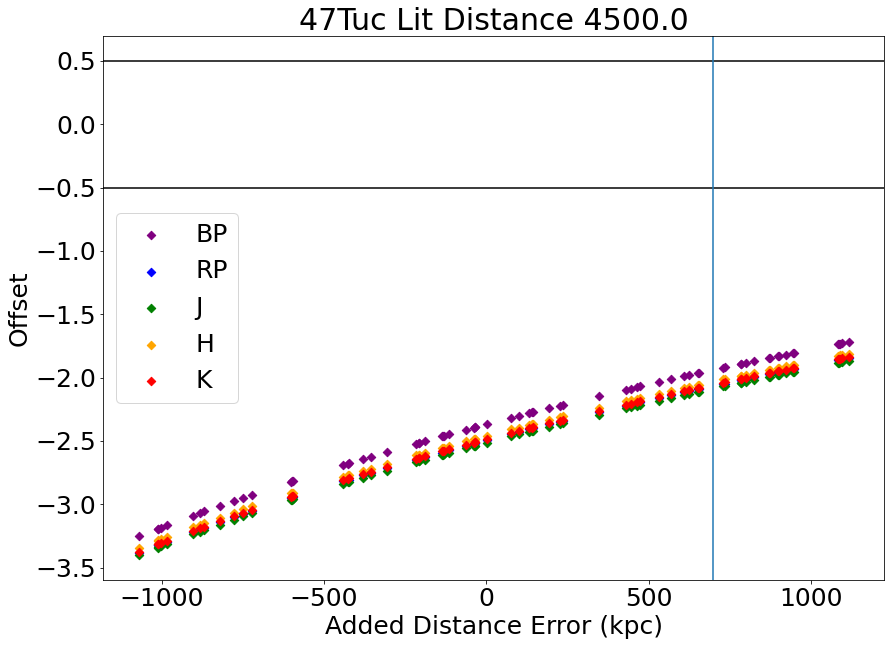

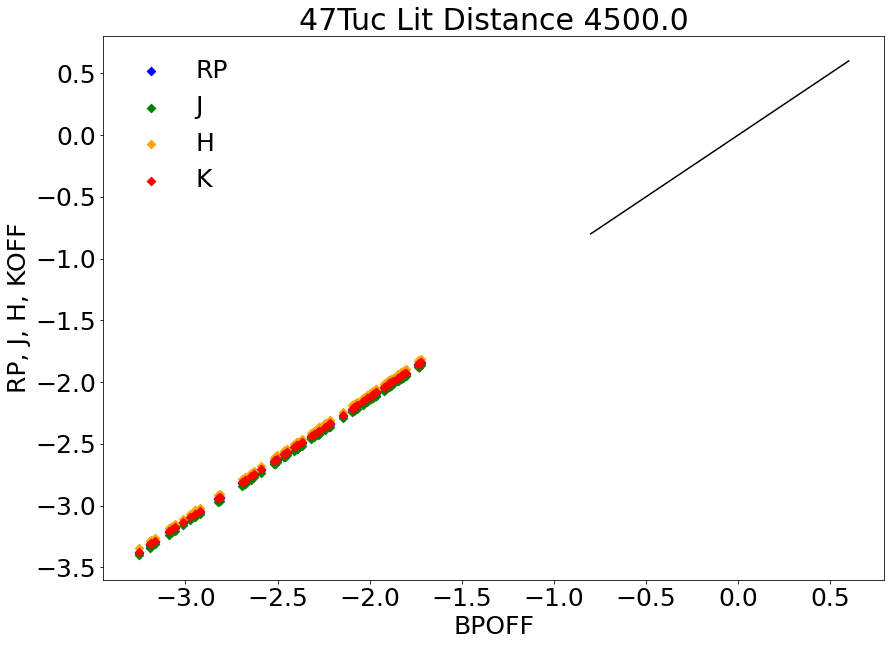

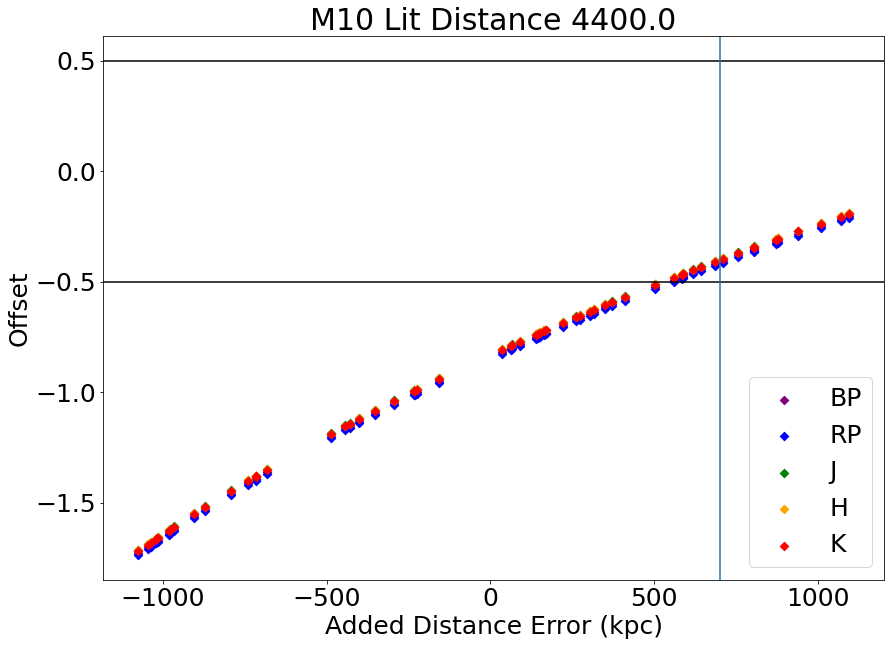

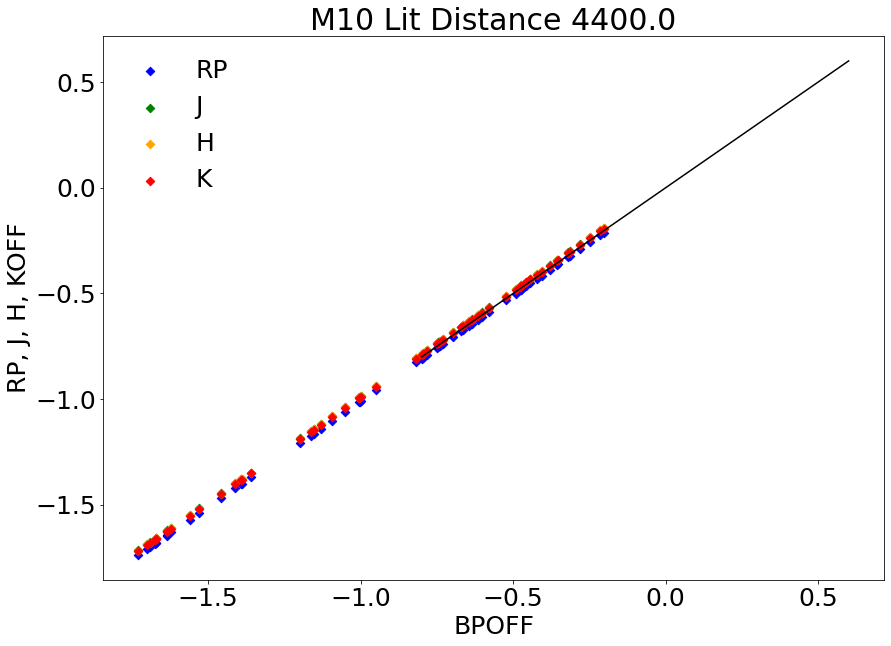

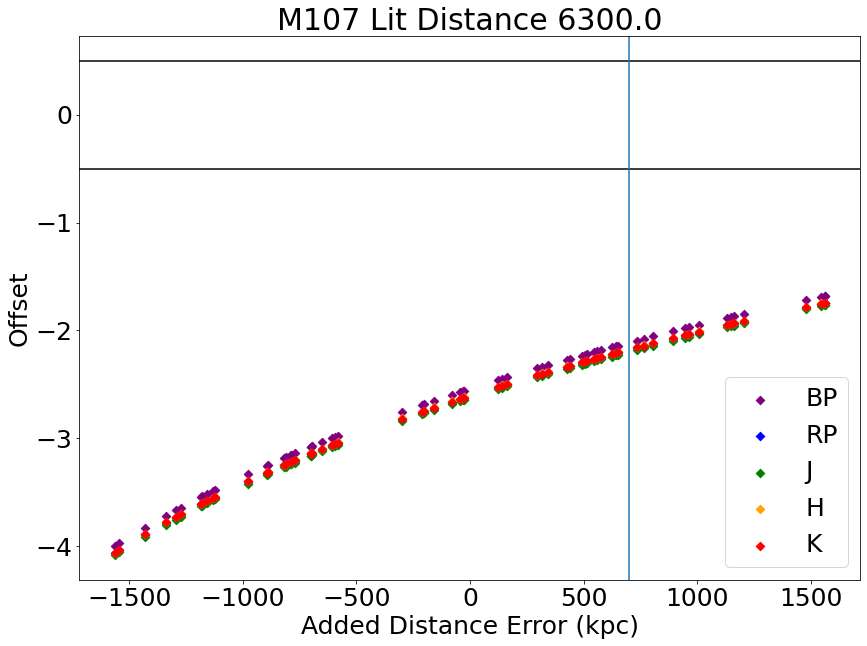

...

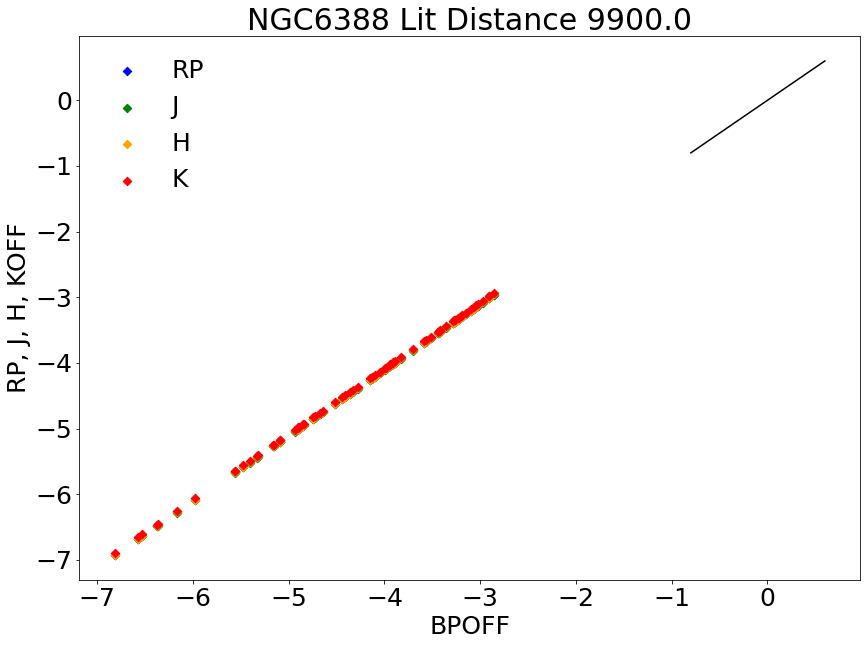

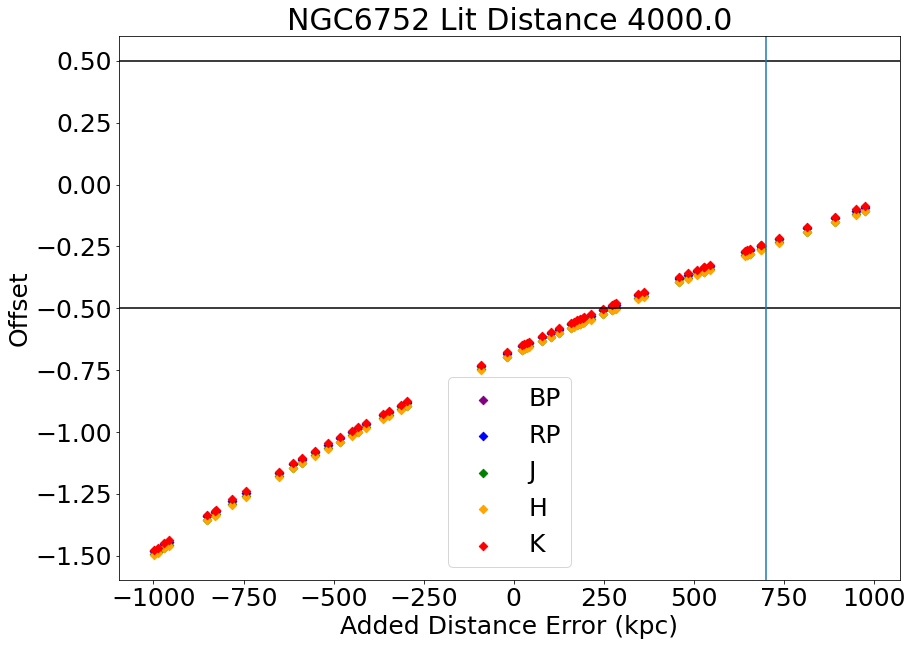

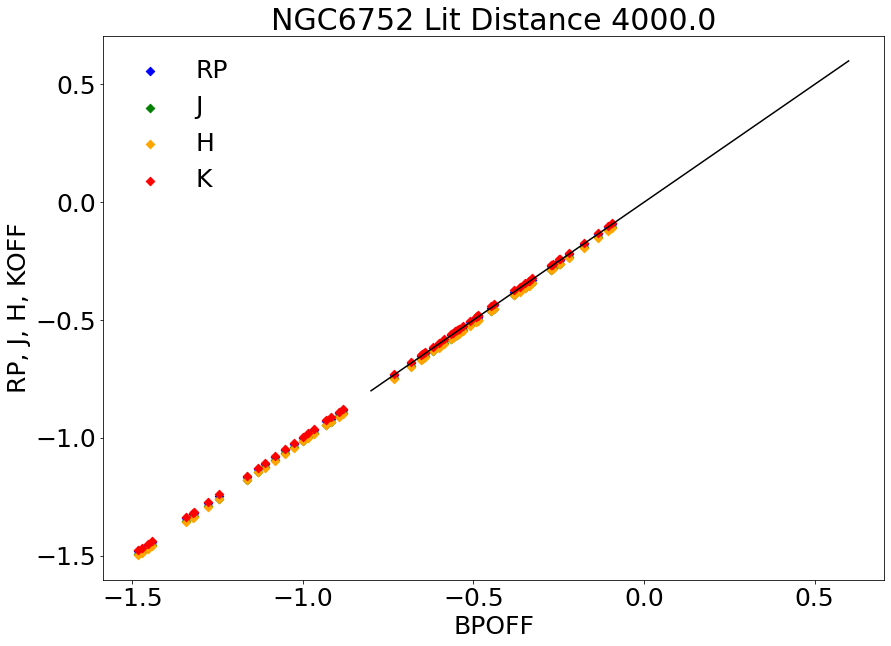

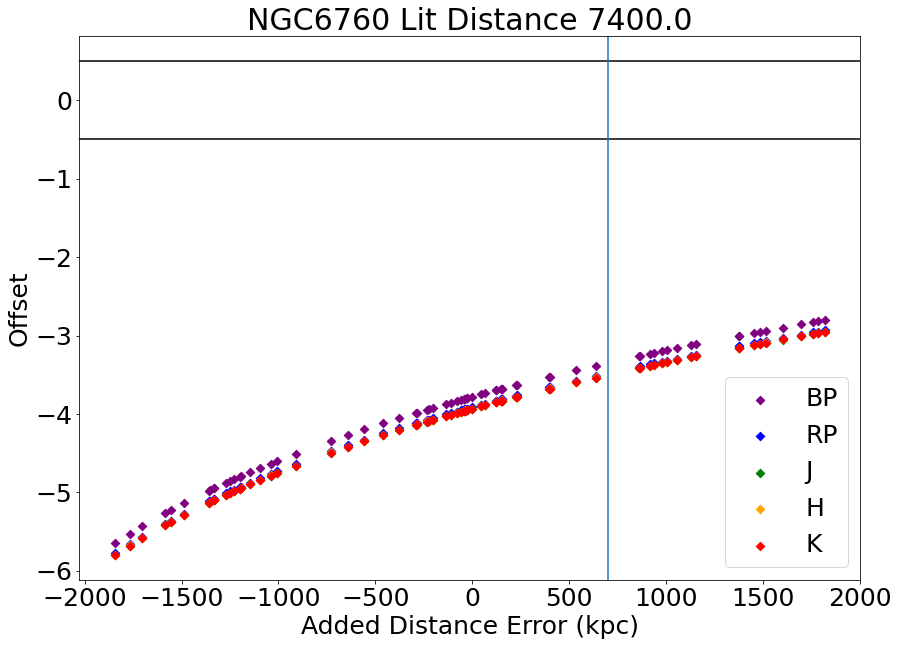

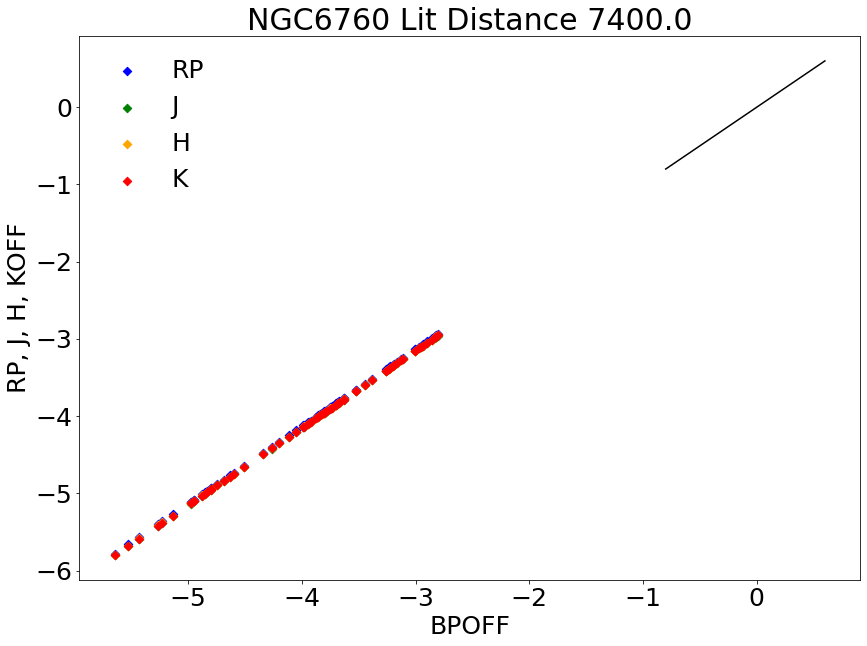

In [42]:
for i in tqdm_notebook(range(len(gcs_clus))):
    clus = np.where(gcs['CLUSTER']==gcs_clus[i])
    
    isopick = massive[np.where((massive['logAge']==closest(massive['logAge'],np.log10(vanden_age[i]*10**9)))&
                               (massive['MH']==closest(massive['MH'],vanden_feh[i])))]
    isopick = isopick[np.argsort(isopick['logTe'])]
    
    ### interpolate isochrones
    bp_spl = IUS(10**sorte['logTe'][::2],sorte['G_BPmag'][::2])
    rp_spl = IUS(10**sorte['logTe'][::2],sorte['G_RPmag'][::2])
    j_spl = IUS(10**sorte['logTe'][::2],sorte['Jmag'][::2])
    h_spl = IUS(10**sorte['logTe'][::2],sorte['Hmag'][::2])
    k_spl = IUS(10**sorte['logTe'][::2],sorte['Ksmag'][::2])
    
    ### distance "error" upto +/- 2000 pc
    dclusshift = np.random.uniform(0,harris_dist[i]*0.25,len(isopick))*(-1)**np.random.randint(2,size=len(isopick))
    
    ### Spectroscopic
    synteff = np.random.normal(10**isopick['logTe'],np.nanmedian(gcsdr17['TEFF_ERR']),len(isopick))
    synfeh = np.random.normal(m22_vanfeh,np.nanmedian(gcsdr17['FE_H_ERR']),len(isopick))

    ### With Extinction
    synbpext = 999999.0*np.ones(len(isopick)) 
    synrpext = 999999.0*np.ones(len(isopick)) 
    synjext = 999999.0*np.ones(len(isopick)) 
    synhext = 999999.0*np.ones(len(isopick)) 
    synkext = 999999.0*np.ones(len(isopick))
    
    ### Extinct Data
    for j in range(len(isopick)):
        bpmag = (np.random.normal(isopick['G_BPmag'][j],np.nanmedian(bperr))+5*np.log10(harris_dist[i])-5.0)
        rpmag = (np.random.normal(isopick['G_RPmag'][j],np.nanmedian(rperr))+5*np.log10(harris_dist[i])-5.0)
        jmag = (np.random.normal(isopick['Jmag'][j],np.nanmedian(gcsdr17['J_ERR']))+5*np.log10(harris_dist[i])-5.0)
        hmag = (np.random.normal(isopick['Hmag'][j],np.nanmedian(gcsdr17['H_ERR']))+5*np.log10(harris_dist[i])-5.0)
        kmag = (np.random.normal(isopick['Ksmag'][j],np.nanmedian(gcsdr17['K_ERR']))+5*np.log10(harris_dist[i])-5.0)

        # BP magnitudes
        if np.isfinite(bpmag)==True:
            synbpext[j] = bpmag+0.34*abp_ebv
        else:
            synbpext[j] = 999999.0

        # RP magnitudes
        if np.isfinite(rpmag)==True:
            synrpext[j] = rpmag+0.34*arp_ebv
        else:
            synrpext[j] = 999999.0

        # J magnitudes
        if np.isfinite(jmag)==True:
            synjext[j] = jmag+0.34*aj_ebv
        else:
            synjext[j] = 999999.0

        # H magnitudes
        if np.isfinite(hmag)==True:
            synhext[j] = hmag+0.34*ah_ebv
        else:
            synhext[j] = 999999.0

        # K magnitudes
        if np.isfinite(kmag)==True:
            synkext[j] = kmag+0.34*ak_ebv
        else:
            synkext[j] = 999999.0
    
    ### Calculate Shifts
    bpshifts = []
    rpshifts = []
    jshifts = []
    hshifts = []
    kshifts = []

    for k in range(len(isopick)):

        ### Calculate offsets    
        bpshifts.append(bp_spl(synteff)-(synbpext-0.34*abp_ebv-5*np.log10(3200+dclusshift[k])+5.0))
        rpshifts.append(rp_spl(synteff)-(synrpext-0.34*arp_ebv-5*np.log10(3200+dclusshift[k])+5.0))
        jshifts.append(j_spl(synteff)-(synjext-0.34*aj_ebv-5*np.log10(3200+dclusshift[k])+5.0))
        hshifts.append(h_spl(synteff)-(synhext-0.34*ah_ebv-5*np.log10(3200+dclusshift[k])+5.0))
        kshifts.append(k_spl(synteff)-(synkext-0.34*ak_ebv-5*np.log10(3200+dclusshift[k])+5.0))
        
        
    offsbp = 999999.0*np.ones(len(isopick))
    offsrp = 999999.0*np.ones(len(isopick))
    offsj = 999999.0*np.ones(len(isopick))
    offsh = 999999.0*np.ones(len(isopick))
    offsk = 999999.0*np.ones(len(isopick))

    for l in range(len(isopick)):
        offsbp[l] = np.nanmedian(bpshifts[l])
        offsrp[l] = np.nanmedian(rpshifts[l])
        offsj[l] = np.nanmedian(jshifts[l])
        offsh[l] = np.nanmedian(hshifts[l])
        offsk[l] = np.nanmedian(kshifts[l])

    plt.figure(figsize=[14,10])
    plt.scatter(dclusshift,offsbp,marker='D',c='purple',label='BP')
    plt.scatter(dclusshift,offsrp,marker='D',c='blue',label='RP')
    plt.scatter(dclusshift,offsj,marker='D',c='green',label='J')
    plt.scatter(dclusshift,offsh,marker='D',c='orange',label='H')
    plt.scatter(dclusshift,offsk,marker='D',c='red',label='K')

    plt.axhline(-0.5,c='k')
    plt.axhline(0.5,c='k')

    plt.axvline(700)

    plt.legend()
    plt.title(r'{} Lit Distance {}'.format(gcs_clus[i],harris_dist[i]))
    plt.xlabel(r'Added Distance Error (kpc)')
    plt.ylabel(r'Offset')
    plt.show()
    
    plt.figure(figsize=[14,10])
    plt.scatter(offsbp,offsrp,marker='D',c='b',label='RP')
    plt.scatter(offsbp,offsj,marker='D',c='g',label='J')
    plt.scatter(offsbp,offsh,marker='D',c='orange',label='H')
    plt.scatter(offsbp,offsk,marker='D',c='r',label='K')
    plt.legend(frameon=False)
    plt.plot([-0.8,0.6],[-0.8,0.6],c='k')
    plt.title(r'{} Lit Distance {}'.format(gcs_clus[i],harris_dist[i]))
    plt.xlabel('BPOFF')
    plt.ylabel('RP, J, H, KOFF')
    plt.show()

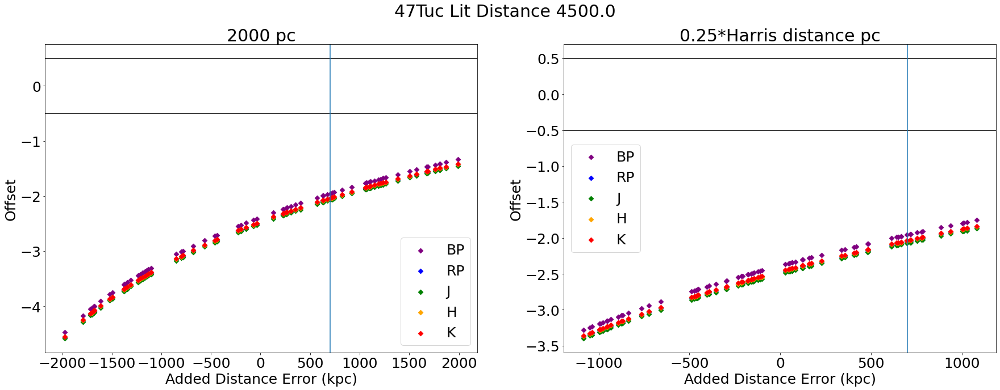

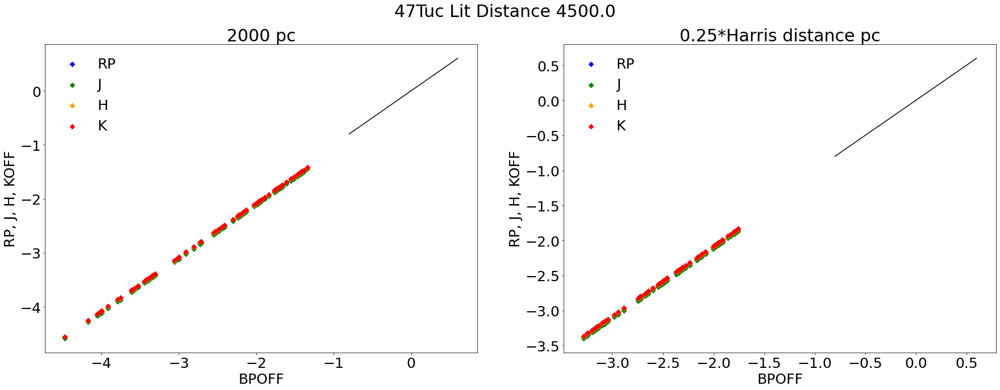

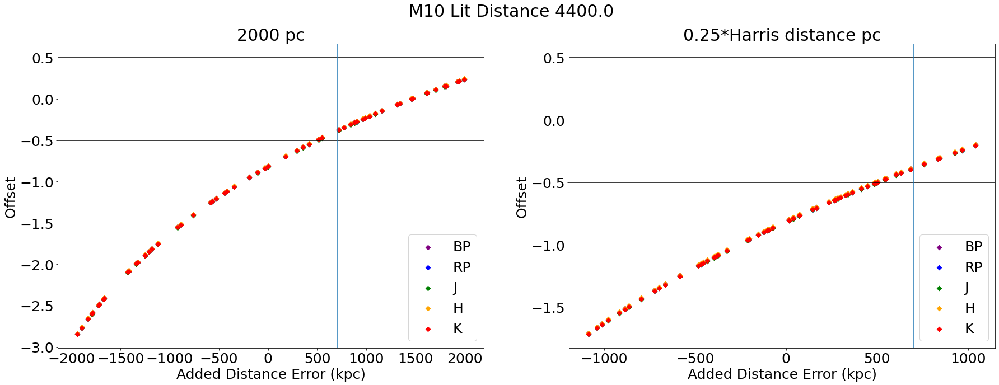

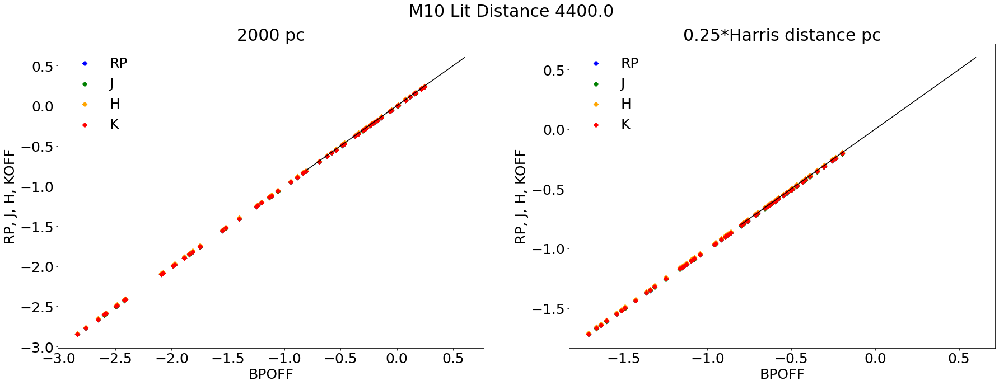

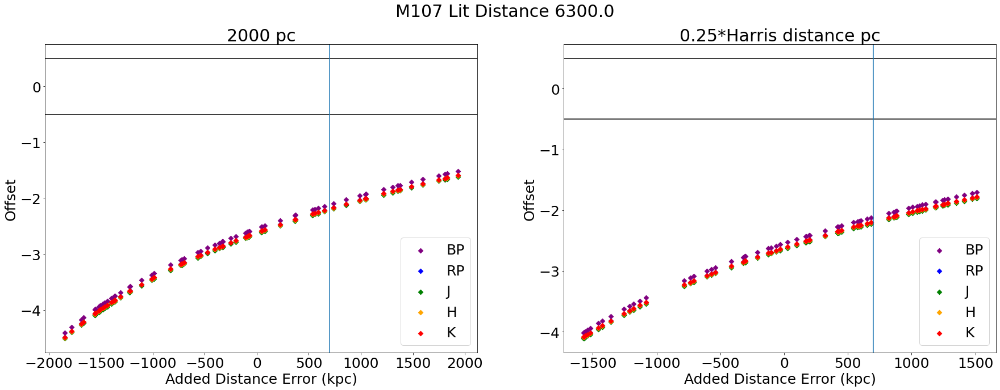

...

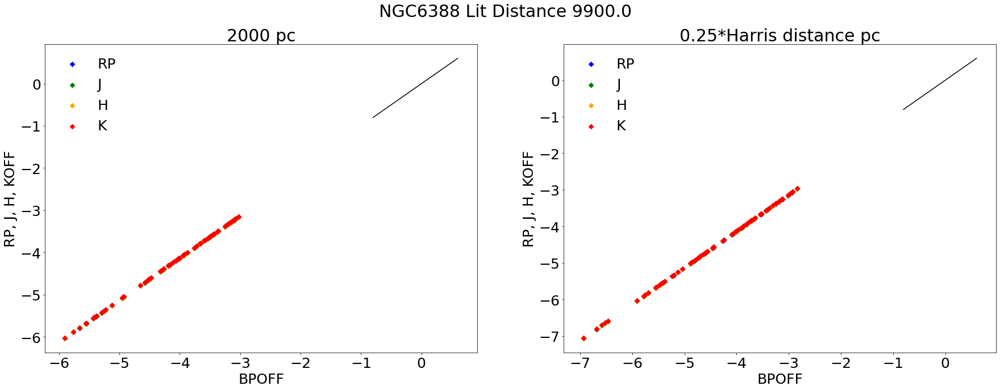

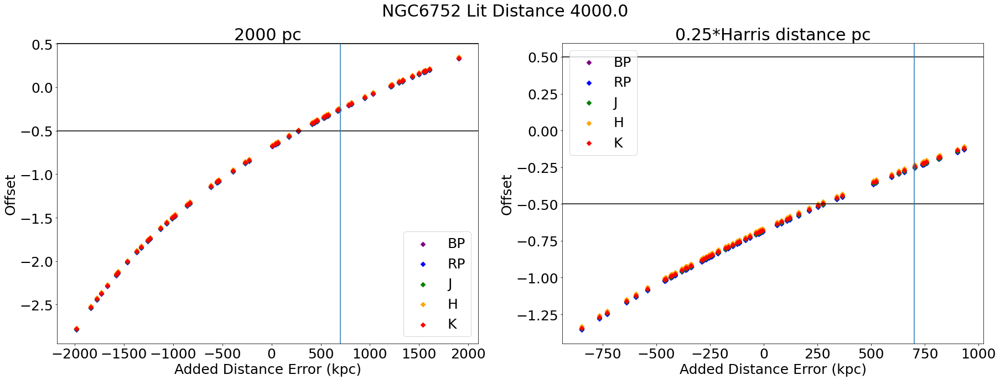

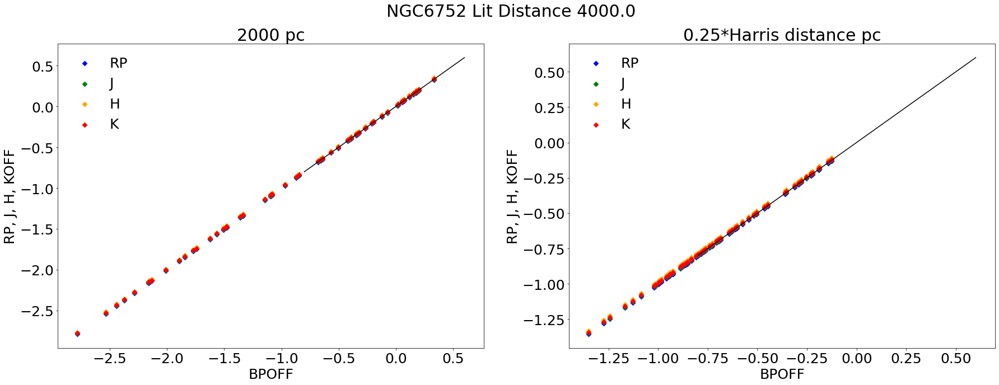

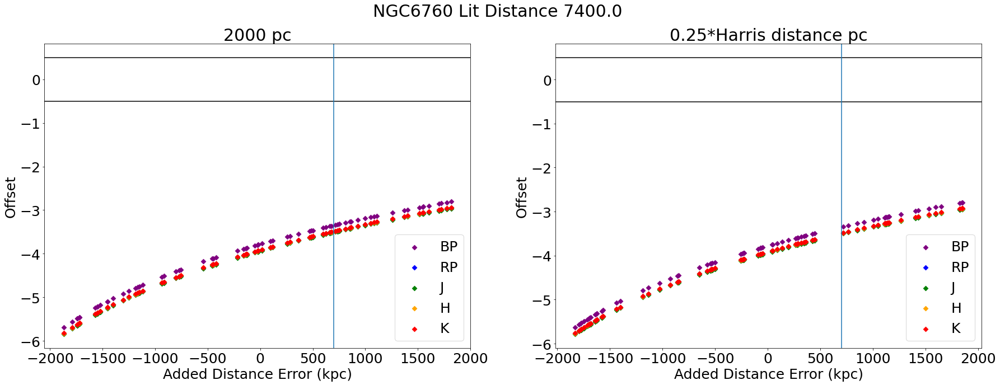

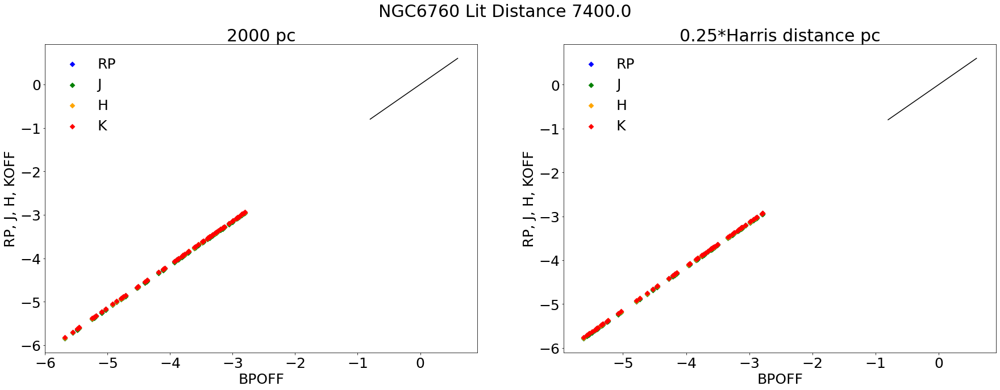

In [43]:
allbpoffs = []
allrpoffs = []
alljoffs = []
allhoffs = []
allkoffs = []

allbpoffs2 = []
allrpoffs2 = []
alljoffs2 = []
allhoffs2 = []
allkoffs2 = []

for i in tqdm_notebook(range(len(gcs_clus))):
    clus = np.where(gcs['CLUSTER']==gcs_clus[i])
    
    isopick = massive[np.where((massive['logAge']==closest(massive['logAge'],np.log10(vanden_age[i]*10**9)))&
                               (massive['MH']==closest(massive['MH'],vanden_feh[i])))]
    isopick = isopick[np.argsort(isopick['logTe'])]
    
    ### interpolate isochrones
    bp_spl = IUS(10**sorte['logTe'][::2],sorte['G_BPmag'][::2])
    rp_spl = IUS(10**sorte['logTe'][::2],sorte['G_RPmag'][::2])
    j_spl = IUS(10**sorte['logTe'][::2],sorte['Jmag'][::2])
    h_spl = IUS(10**sorte['logTe'][::2],sorte['Hmag'][::2])
    k_spl = IUS(10**sorte['logTe'][::2],sorte['Ksmag'][::2])
    
    ### distance "error" upto +/- 2000 pc
    dclusshift = np.random.uniform(0,2000,len(isopick))*(-1)**np.random.randint(2,size=len(isopick))
    dclusshift2 = np.random.uniform(0,harris_dist[i]*0.25,len(isopick))*(-1)**np.random.randint(2,size=len(isopick))
    
    ### Spectroscopic
    synteff = np.random.normal(10**isopick['logTe'],np.nanmedian(gcsdr17['TEFF_ERR']),len(isopick))
    synfeh = np.random.normal(m22_vanfeh,np.nanmedian(gcsdr17['FE_H_ERR']),len(isopick))

    ### With Extinction
    synbpext = 999999.0*np.ones(len(isopick)) 
    synrpext = 999999.0*np.ones(len(isopick)) 
    synjext = 999999.0*np.ones(len(isopick)) 
    synhext = 999999.0*np.ones(len(isopick)) 
    synkext = 999999.0*np.ones(len(isopick))
                                                                                                
    synbpext2 = 999999.0*np.ones(len(isopick)) 
    synrpext2 = 999999.0*np.ones(len(isopick)) 
    synjext2 = 999999.0*np.ones(len(isopick)) 
    synhext2 = 999999.0*np.ones(len(isopick)) 
    synkext2 = 999999.0*np.ones(len(isopick))                                                                                            
    
    ### Extinct Data
    for j in range(len(isopick)):
        bpmag = (np.random.normal(isopick['G_BPmag'][j],np.nanmedian(bperr))+5*np.log10(harris_dist[i])-5.0)
        rpmag = (np.random.normal(isopick['G_RPmag'][j],np.nanmedian(rperr))+5*np.log10(harris_dist[i])-5.0)
        jmag = (np.random.normal(isopick['Jmag'][j],np.nanmedian(gcsdr17['J_ERR']))+5*np.log10(harris_dist[i])-5.0)
        hmag = (np.random.normal(isopick['Hmag'][j],np.nanmedian(gcsdr17['H_ERR']))+5*np.log10(harris_dist[i])-5.0)
        kmag = (np.random.normal(isopick['Ksmag'][j],np.nanmedian(gcsdr17['K_ERR']))+5*np.log10(harris_dist[i])-5.0)

        # BP magnitudes
        if np.isfinite(bpmag)==True:
            synbpext[j] = bpmag+0.34*abp_ebv
        else:
            synbpext[j] = 999999.0

        # RP magnitudes
        if np.isfinite(rpmag)==True:
            synrpext[j] = rpmag+0.34*arp_ebv
        else:
            synrpext[j] = 999999.0

        # J magnitudes
        if np.isfinite(jmag)==True:
            synjext[j] = jmag+0.34*aj_ebv
        else:
            synjext[j] = 999999.0

        # H magnitudes
        if np.isfinite(hmag)==True:
            synhext[j] = hmag+0.34*ah_ebv
        else:
            synhext[j] = 999999.0

        # K magnitudes
        if np.isfinite(kmag)==True:
            synkext[j] = kmag+0.34*ak_ebv
        else:
            synkext[j] = 999999.0
    
    ### Calculate Shifts
    bpshifts = []
    rpshifts = []
    jshifts = []
    hshifts = []
    kshifts = []
                                                                                                
    bpshifts2 = []
    rpshifts2 = []
    jshifts2 = []
    hshifts2 = []
    kshifts2 = []

    for k in range(len(isopick)):

        ### Calculate offsets    
        bpshifts.append(bp_spl(synteff)-(synbpext-0.34*abp_ebv-5*np.log10(3200+dclusshift[k])+5.0))
        rpshifts.append(rp_spl(synteff)-(synrpext-0.34*arp_ebv-5*np.log10(3200+dclusshift[k])+5.0))
        jshifts.append(j_spl(synteff)-(synjext-0.34*aj_ebv-5*np.log10(3200+dclusshift[k])+5.0))
        hshifts.append(h_spl(synteff)-(synhext-0.34*ah_ebv-5*np.log10(3200+dclusshift[k])+5.0))
        kshifts.append(k_spl(synteff)-(synkext-0.34*ak_ebv-5*np.log10(3200+dclusshift[k])+5.0))
                                                                                                
        bpshifts2.append(bp_spl(synteff)-(synbpext-0.34*abp_ebv-5*np.log10(3200+dclusshift2[k])+5.0))
        rpshifts2.append(rp_spl(synteff)-(synrpext-0.34*arp_ebv-5*np.log10(3200+dclusshift2[k])+5.0))
        jshifts2.append(j_spl(synteff)-(synjext-0.34*aj_ebv-5*np.log10(3200+dclusshift2[k])+5.0))
        hshifts2.append(h_spl(synteff)-(synhext-0.34*ah_ebv-5*np.log10(3200+dclusshift2[k])+5.0))
        kshifts2.append(k_spl(synteff)-(synkext-0.34*ak_ebv-5*np.log10(3200+dclusshift2[k])+5.0))                                                                                        
        
        
    offsbp = 999999.0*np.ones(len(isopick))
    offsrp = 999999.0*np.ones(len(isopick))
    offsj = 999999.0*np.ones(len(isopick))
    offsh = 999999.0*np.ones(len(isopick))
    offsk = 999999.0*np.ones(len(isopick))
                                                                                                
    offsbp2 = 999999.0*np.ones(len(isopick))
    offsrp2 = 999999.0*np.ones(len(isopick))
    offsj2 = 999999.0*np.ones(len(isopick))
    offsh2 = 999999.0*np.ones(len(isopick))
    offsk2 = 999999.0*np.ones(len(isopick))

    for l in range(len(isopick)):
        offsbp[l] = np.nanmedian(bpshifts[l])
        offsrp[l] = np.nanmedian(rpshifts[l])
        offsj[l] = np.nanmedian(jshifts[l])
        offsh[l] = np.nanmedian(hshifts[l])
        offsk[l] = np.nanmedian(kshifts[l])
                                                                                                
        offsbp2[l] = np.nanmedian(bpshifts2[l])
        offsrp2[l] = np.nanmedian(rpshifts2[l])
        offsj2[l] = np.nanmedian(jshifts2[l])
        offsh2[l] = np.nanmedian(hshifts2[l])
        offsk2[l] = np.nanmedian(kshifts2[l])
        
    allbpoffs.append(offsbp)
    allrpoffs.append(offsrp)
    alljoffs.append(offsj)
    allhoffs.append(offsh)
    allkoffs.append(offsk)
    
    allbpoffs2.append(offsbp2)
    allrpoffs2.append(offsrp2)
    alljoffs2.append(offsj2)
    allhoffs2.append(offsh2)
    allkoffs2.append(offsk2)

    plt.figure(figsize=[30,10])
    
    plt.subplot(121)
    plt.scatter(dclusshift,offsbp,marker='D',c='purple',label='BP')
    plt.scatter(dclusshift,offsrp,marker='D',c='blue',label='RP')
    plt.scatter(dclusshift,offsj,marker='D',c='green',label='J')
    plt.scatter(dclusshift,offsh,marker='D',c='orange',label='H')
    plt.scatter(dclusshift,offsk,marker='D',c='red',label='K')

    plt.axhline(-0.5,c='k')
    plt.axhline(0.5,c='k')

    plt.axvline(700)                                                                                        

    plt.legend()
    plt.title('2000 pc')#r'{} Lit Distance {}'.format(gcs_clus[i],harris_dist[i]))
    plt.xlabel(r'Added Distance Error (kpc)')
    plt.ylabel(r'Offset')
    
    plt.subplot(122)
    plt.scatter(dclusshift2,offsbp2,marker='D',c='purple',label='BP')
    plt.scatter(dclusshift2,offsrp2,marker='D',c='blue',label='RP')
    plt.scatter(dclusshift2,offsj2,marker='D',c='green',label='J')
    plt.scatter(dclusshift2,offsh2,marker='D',c='orange',label='H')
    plt.scatter(dclusshift2,offsk2,marker='D',c='red',label='K')

    plt.axhline(-0.5,c='k')
    plt.axhline(0.5,c='k')

    plt.axvline(700)                                                                                        

    plt.legend()
    plt.title('0.25*Harris distance pc')#r'{} Lit Distance {}'.format(gcs_clus[i],harris_dist[i]))
    plt.xlabel(r'Added Distance Error (kpc)')
    plt.ylabel(r'Offset')
    
    plt.suptitle(r'{} Lit Distance {}'.format(gcs_clus[i],harris_dist[i]))
    plt.show()
    
    plt.figure(figsize=[30,10])
    
    plt.subplot(121)
    plt.scatter(offsbp,offsrp,marker='D',c='b',label='RP')
    plt.scatter(offsbp,offsj,marker='D',c='g',label='J')
    plt.scatter(offsbp,offsh,marker='D',c='orange',label='H')
    plt.scatter(offsbp,offsk,marker='D',c='r',label='K')
    plt.legend(frameon=False)
    plt.plot([-0.8,0.6],[-0.8,0.6],c='k')
    plt.title('2000 pc')#r'{} Lit Distance {}'.format(gcs_clus[i],harris_dist[i]))
    plt.xlabel('BPOFF')
    plt.ylabel('RP, J, H, KOFF')
    
    plt.subplot(122)
    plt.scatter(offsbp2,offsrp2,marker='D',c='b',label='RP')
    plt.scatter(offsbp2,offsj2,marker='D',c='g',label='J')
    plt.scatter(offsbp2,offsh2,marker='D',c='orange',label='H')
    plt.scatter(offsbp2,offsk2,marker='D',c='r',label='K')
    plt.legend(frameon=False)
    plt.plot([-0.8,0.6],[-0.8,0.6],c='k')
    plt.title('0.25*Harris distance pc')#r'{} Lit Distance {}'.format(gcs_clus[i],harris_dist[i]))
    plt.xlabel('BPOFF')
    plt.ylabel('RP, J, H, KOFF')
    
    plt.suptitle(r'{} Lit Distance {}'.format(gcs_clus[i],harris_dist[i]))
    plt.show()

# Parallax Offset

(array([  1.,   1.,   1., 198.,   1.,   0.,   0.,   1.,   0.,   1.]),
 array([-8426.721 , -4902.389 , -1378.0574,  2146.2742,  5670.606 ,
         9194.9375, 12719.27  , 16243.601 , 19767.932 , 23292.264 ,
        26816.596 ], dtype=float32),
 <a list of 10 Patch objects>)

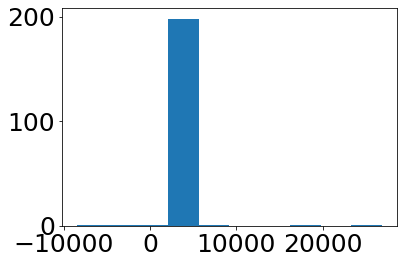

In [44]:
plt.hist(1000/(gcsdr17[np.where(gcs['CLUSTER']=='M22')]['GAIAEDR3_PARALLAX']))

(array([  1.,   1.,   1., 198.,   1.,   0.,   0.,   1.,   0.,   1.]),
 array([-8426.721 , -4902.389 , -1378.0574,  2146.2742,  5670.606 ,
         9194.9375, 12719.27  , 16243.601 , 19767.932 , 23292.264 ,
        26816.596 ], dtype=float32),
 <a list of 10 Patch objects>)

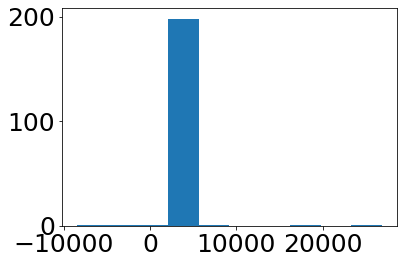

In [45]:
plt.hist(1000/gcsdr17['GAIAEDR3_PARALLAX'][np.where(gcs['CLUSTER']=='M22')])

In [46]:
np.nanmedian(1000/gcsdr17['GAIAEDR3_PARALLAX'][np.where(gcs['CLUSTER']=='M22')])

3595.8345

In [47]:
paroff = 999999.0*np.ones(len(gcs_clus))
for i in range(len(gcs_clus)):
    clus = np.where(gcs['CLUSTER']==gcs_clus[i])
    paroff[i] = np.nanmedian(1000/gcsdr17['GAIAEDR3_PARALLAX'][clus])-harris_dist[i]
    print('{}'.format(gcs_clus[i]),np.nanmedian(1000/gcsdr17['GAIAEDR3_PARALLAX'][clus])-harris_dist[i])

47Tuc 312.7890625
M10 1313.3203125
M107 165.0078125
M12 881.0
M13 2503.99609375
M15 6299.962890625
M19 703.705078125
M2 2289.904296875
M22 395.83447265625
M3 3816.41796875
M4 -324.9765625
M5 2525.91796875
M53 10450.326171875
M54 -3505.248046875
M55 235.8076171875
M68 3105.96875
M71 552.0009765625
M79 3422.986328125
M92 3114.984375
NGC1851 5082.078125
NGC2808 2697.58984375
NGC288 759.451171875
NGC3201 422.38232421875
NGC362 1999.5595703125
NGC5053 -8197.62109375
NGC5466 16939.3046875
NGC6304 2778.8193359375
NGC6388 2757.697265625
NGC6752 503.09765625
NGC6760 7780.404296875


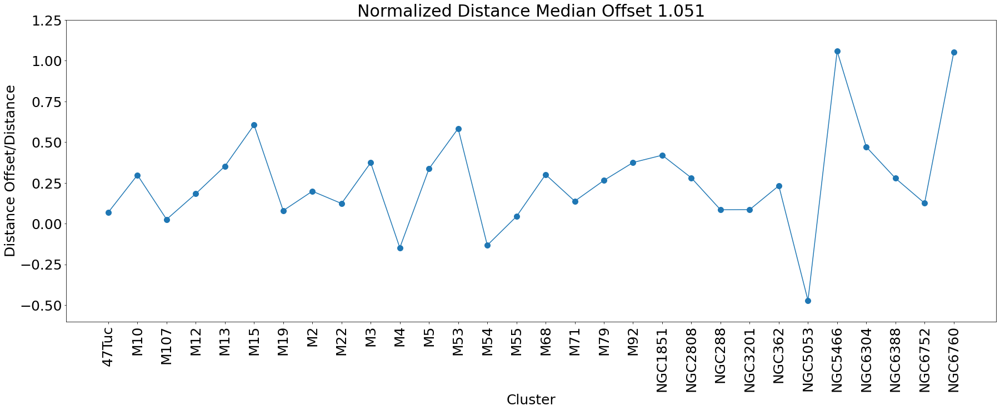

In [57]:
plt.figure(figsize=[30,10])
plt.scatter(range(30),paroff/harris_dist,s=100)
plt.plot(range(30),paroff/harris_dist)
plt.ylim(-0.6,1.25)
plt.xticks(range(30),labels=list(gcs_clus),rotation='vertical')
plt.title(r'Normalized Distance Median Offset {:.3f}'.format(np.nanmedian((paroff/harris_dist)[i])))
plt.ylabel(r'Distance Offset/Distance')
plt.xlabel(r'Cluster')
plt.savefig('../plots/normdistanceoff.pdf',bbox_inches='tight')
plt.show()

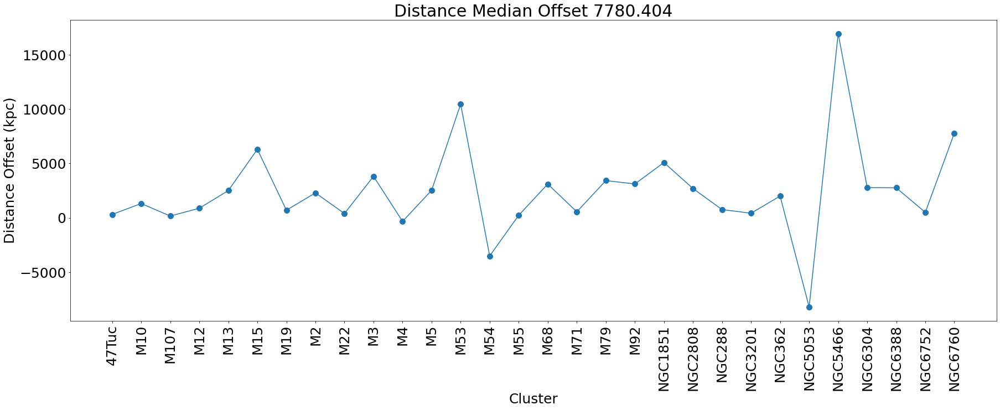

In [58]:
plt.figure(figsize=[30,10])
plt.scatter(range(30),paroff,s=100)
plt.plot(range(30),paroff)
plt.xticks(range(30),labels=list(gcs_clus),rotation='vertical')
plt.title(r'Distance Median Offset {:.3f}'.format(np.nanmedian((paroff)[i])))
plt.ylabel(r'Distance Offset (kpc)')
plt.xlabel(r'Cluster')
plt.savefig('../plots/distanceoff.pdf',bbox_inches='tight')
plt.show()

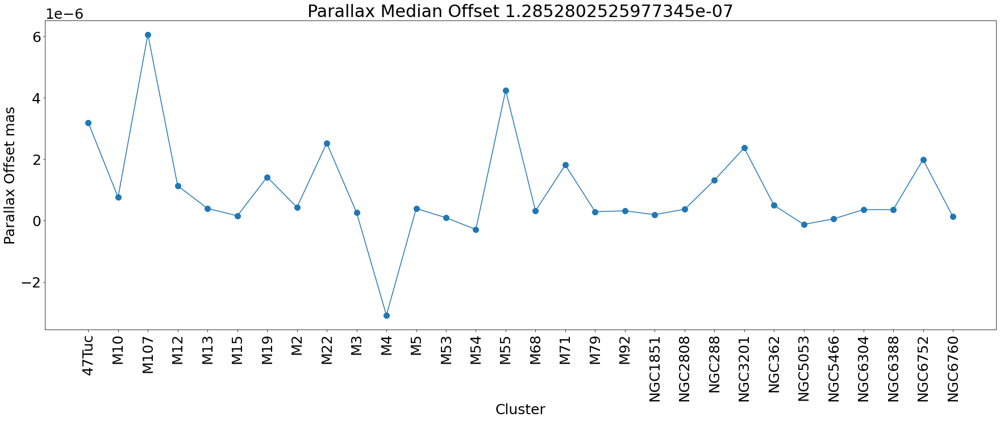

In [59]:
plt.figure(figsize=[30,10])
plt.scatter(range(30),1/paroff/1000,s=100)
plt.plot(range(30),1/paroff/1000)
plt.xticks(range(30),labels=list(gcs_clus),rotation='vertical')
plt.title(r'Parallax Median Offset {}'.format(np.nanmedian((1/paroff/1000)[i])))
plt.ylabel(r'Parallax Offset mas')
plt.xlabel(r'Cluster')
plt.savefig('../plots/parallaxoff.pdf',bbox_inches='tight')
plt.show()

pull out of paper differnce vs distance 

also in paper system offset parallax